In [ ]:
import re
import unicodedata
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pywaffle import Waffle
import matplotlib.patches as mpatches
import math
from clinica.utils.tables import *
from style.style_manager import StyleManager
import os
from datetime import date, datetime

# In your notebook
from clinica.utils import (
    create_violin_plots,
    create_histogram_plots,
    # create_table_image,
    create_summary_table
)

# Auto-reload modules before executing code
%load_ext autoreload
%autoreload 2
from IPython.display import Image, display

#export PROJ_ROOT=~/Documents/TESI/FOLDER_CINECA/clinica
import os
os.environ["PROJ_ROOT"] = "/home/zano/Documents/TESI/FOLDER_CINECA/"
PROJ_ROOT = os.getenv("PROJ_ROOT")
STYLE_PATH = os.path.join(PROJ_ROOT, "style", "thesis_style.mplstyle")
CSV_PATH = Path("minimal.csv")
NA_VALUES = ["", " ", "na","Nan", "Na", "NA", "n/a", "N/A", "\xa0"]
CLASSES_ORDER = ['MSA-P', 'MSA-C', 'PD']
print("PROJ_ROOT:", PROJ_ROOT)
IMAGES_SAVE_PATH = os.path.join(PROJ_ROOT, "images")
print("IMAGES_SAVE_PATH:", IMAGES_SAVE_PATH)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
PROJ_ROOT: /home/zano/Documents/TESI/FOLDER_CINECA/
IMAGES_SAVE_PATH: /home/zano/Documents/TESI/FOLDER_CINECA/images


In [74]:
df_raw = pd.read_csv(
    CSV_PATH,
    sep=",",
    encoding="utf-8",
    na_values=NA_VALUES,
    usecols=lambda col: col.strip() != "",  # drop the exported index column
)

# Drop the first column, which only contains indices from the export
df_raw = df_raw.iloc[:, 1:]
df_raw.head()

,CODICE,Sesso,Data di nascita,Diagnosi DI INVIO,Diagnosi DEFINITA,ANNOTAZIONI SU DIAGNOSI FINALE,ANNO DIAGNOSI,ANNO ESORDIO SINTOMI MOTORI,ANNO ESORDIO SINTOMI NON MOTORI,ANNO ESORDIO DISAUTONOMIA,...,Cognitive decline,Normal RMN,Atrofia del putamen,Atrofia peduncoli cerebellari medi,Atrofia ponte,Atrofia cervelletto,Hot cross bun sign,Iperintensità putamen,Iperintensità peduncoli cerebellari medi,Caduta segnale putamen
0,5435,F,15/04/1950,MSA-P,MSA-P,NaN,2022,2020,2020.0,2020.0,...,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,5717,M,25/02/1973,MSA-P,MSA-P,NaN,2022,2020,2019.0,2019.0,...,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,5745,F,15/08/1959,MSA-P,MSA-P,NaN,2022,2021,2021.0,NaN,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
3,5753,F,09/04/1958,MSA-P/C,MSA-P,NaN,2022,2019,2019.0,2019.0,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,5767,F,16/09/1960,MSA-P,MSA-P,prob,2022,2019,2021.0,2022.0,...,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Normalize and sluggify code

In [75]:
df_raw.columns
# print("num_columns:", len(df_raw.columns))

Index(['CODICE', 'Sesso', 'Data di nascita', 'Diagnosi DI INVIO',
       'Diagnosi DEFINITA', 'ANNOTAZIONI SU DIAGNOSI FINALE', 'ANNO DIAGNOSI',
       'ANNO ESORDIO SINTOMI MOTORI', 'ANNO ESORDIO SINTOMI NON MOTORI',
       'ANNO ESORDIO DISAUTONOMIA', 'Età esordio', 'Durata malattia',
       'ANNI L-DOPA', 'ANNI DOPAMINOAAGONISTI', 'LEDD', 'UPDRS ON',
       'UPDRS OFF', 'Delta OFF ON', 'H & Y', 'deambulaz autonoma',
       'deambulaz appoggio', 'carrozzina', 'Cadute', 'Compass Totale',
       'Compass-OH', 'Compass-Vasc', 'Compass-Sudor', 'Compass-GI',
       'Compass-Uin', 'Compass-Pupil', 'Parkinsonism',
       'Poor L-Dopa responsivenes', 'Cerebellar syndrome',
       'Rapid progression w 3 yrs',
       'Moderate to severe postural instability w 3 yrs of motor onset',
       'Craniocervical dyst induced dy L-Dopa',
       'Severe speech impairement w 3 yrs', 'Severe dysphagia w 3 yrs',
       'Unexplained Babinski', 'Jerky myoclonic postural or kinetic tremor',
       'Postural d

In [76]:
def normalize_label(label: str) -> str:
    """
    Normalize column names for consistent, ASCII-only, and analysis-friendly processing.

    Steps performed:
    - Unicode normalization (NFKD form) to separate accents from base characters,
      then drop all non-ASCII (e.g., "è" → "e").
    - Collapse multiple whitespaces into single spaces and strip leading/trailing spaces.
    - Replace "&" with "and" for better compatibility in code or downstream ML.

    Parameters
    ----------
    label : str
        The original column name as extracted from a raw clinical spreadsheet.

    Returns
    -------
    str
        Cleaned, ASCII-only label with consistent whitespace and symbol handling.

    Examples
    --------
    >>> normalize_label("Anni d'età ")
    "Anni d'eta"
    >>> normalize_label("UPDRS & score generale")
    "UPDRS and score generale"
    """
    label = unicodedata.normalize("NFKD", label)
    label = label.encode("ascii", "ignore").decode("ascii")
    label = re.sub(r"\s+", " ", label.strip())
    label = label.replace("&", "and")
    return label

def slugify(label: str) -> str:
    """
    Convert a normalized label into a safe, Pythonic alias (slug).

    Steps performed:
    - Lowercase conversion.
    - Replace any sequence of non-alphanumeric characters with underscores.
    - Remove leading/trailing underscores.

    Parameters
    ----------
    label : str
        Input string (normalized clinical column name).

    Returns
    -------
    str
        Machine-friendly column alias suitable for use as a Pandas DataFrame column,
        YAML key, or Python variable.

    Examples
    --------
    >>> slugify("Anni d'eta")
    'anni_d_eta'
    >>> slugify("UPDRS and score generale")
    'updrs_and_score_generale'
    """
    return re.sub(r"[^0-9a-zA-Z]+", "_", label.lower()).strip("_")

original_columns = df_raw.columns
normalized_labels = [normalize_label(col) for col in original_columns]
#dictionary to map the original columns to the new ones
column_alias = {orig:slugify(norm) for orig, norm in zip (original_columns, normalized_labels)}
#rename the columns
df = df_raw.rename(columns=column_alias)
print("column_alias:\n", column_alias)
print("renamed normalized & slugified columns:\n", df.columns)
print("number of columns:", len(df.columns))

column_alias:
 {'CODICE': 'codice', 'Sesso': 'sesso', 'Data di nascita': 'data_di_nascita', 'Diagnosi DI INVIO': 'diagnosi_di_invio', 'Diagnosi DEFINITA': 'diagnosi_definita', 'ANNOTAZIONI SU DIAGNOSI FINALE': 'annotazioni_su_diagnosi_finale', 'ANNO DIAGNOSI': 'anno_diagnosi', 'ANNO ESORDIO SINTOMI MOTORI': 'anno_esordio_sintomi_motori', 'ANNO ESORDIO SINTOMI NON MOTORI': 'anno_esordio_sintomi_non_motori', 'ANNO ESORDIO DISAUTONOMIA': 'anno_esordio_disautonomia', 'Età esordio': 'eta_esordio', 'Durata malattia': 'durata_malattia', 'ANNI L-DOPA': 'anni_l_dopa', 'ANNI DOPAMINOAAGONISTI': 'anni_dopaminoaagonisti', 'LEDD': 'ledd', 'UPDRS ON': 'updrs_on', 'UPDRS OFF': 'updrs_off', 'Delta OFF ON': 'delta_off_on', 'H & Y': 'h_and_y', 'deambulaz autonoma': 'deambulaz_autonoma', 'deambulaz appoggio': 'deambulaz_appoggio', 'carrozzina': 'carrozzina', 'Cadute': 'cadute', 'Compass Totale': 'compass_totale', 'Compass-OH': 'compass_oh', 'Compass-Vasc': 'compass_vasc', 'Compass-Sudor': 'compass_sudor'

In [77]:
def is_column_contained(df, column_name)->bool:
    """
    Check if a specific column exists in the DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame to check.
    column_name (str): The name of the column to check.

    Returns:
    bool: True if the column exists, False otherwise.
    """
    return column_name in df.columns

is_contained=is_column_contained(df, "severe_speech_impairement_w_3_yrs")
print(is_contained)


True


convert numeric columns into numerics

In [78]:
numeric_patterns = r"(anno|eta|durata|ledd|updrs|delta|compass|score|totale|indice|years?|anni)"
numeric_cols = [col for col in df.columns if re.search(numeric_patterns, col)]
# print(numeric_cols)
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors="coerce")

# binary_cols = [col for col in df.columns if df[col].dropna().astype(str).isin({"0", "1"}).all()]
# if binary_cols:
#     df[binary_cols] = df[binary_cols].apply(pd.to_numeric, errors="coerce").astype("Int8").astype(pd.BooleanDtype())


# if "data_di_nascita" in df.columns:
#     df["data_di_nascita"] = pd.to_datetime(df["data_di_nascita"], dayfirst=True, errors="coerce")
    
df

,codice,sesso,data_di_nascita,diagnosi_di_invio,diagnosi_definita,annotazioni_su_diagnosi_finale,anno_diagnosi,anno_esordio_sintomi_motori,anno_esordio_sintomi_non_motori,anno_esordio_disautonomia,...,cognitive_decline,normal_rmn,atrofia_del_putamen,atrofia_peduncoli_cerebellari_medi,atrofia_ponte,atrofia_cervelletto,hot_cross_bun_sign,iperintensita_putamen,iperintensita_peduncoli_cerebellari_medi,caduta_segnale_putamen
0,5435,F,15/04/1950,MSA-P,MSA-P,NaN,2022,2020,2020.0,2020.0,...,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,5717,M,25/02/1973,MSA-P,MSA-P,NaN,2022,2020,2019.0,2019.0,...,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,5745,F,15/08/1959,MSA-P,MSA-P,NaN,2022,2021,2021.0,NaN,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
3,5753,F,09/04/1958,MSA-P/C,MSA-P,NaN,2022,2019,2019.0,2019.0,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,5767,F,16/09/1960,MSA-P,MSA-P,NaN,2022,2019,2021.0,2022.0,...,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,7461,M,04/01/1959,PD,PD,NaN,2024,2023,2024.0,2024.0,...,0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
84,7544,M,19/08/1977,PD,PD,NaN,2024,2024,2024.0,2024.0,...,0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85,7781,F,23/10/1958,PD,PD,NaN,2024,2023,NaN,NaN,...,0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
86,7787,M,09/12/1966,PD,PD,NaN,2024,2021,2024.0,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Map diagnosi labels with univocal labels

In [79]:
# Convert categorical columns to string and map values
categorical_maps = {
    "diagnosi_di_invio": {"MSA-P ": "MSA-P","MSA-P/C": "MSA-P", "MSA P": "MSA-P", "PD ": "PD", "MSA-C ": "MSA-C", "MSA-C/P": "MSA-C"},
    "diagnosi_definita": {"MSA-P ": "MSA-P", "MSA-P/C": "MSA-P", "PD ": "PD", "MSA-C ": "MSA-C", "MSA-C/P": "MSA-C"},
}
for col in ["diagnosi_di_invio", "diagnosi_definita"]:
    if col in df.columns:
        series = (
            df[col]
            .astype("string") #convert to string
            .str.strip() #strip whitespace
            .replace("", pd.NA) #replace empty strings with NA
        )
        series = series.str.upper() #convert to uppercase
        if col in categorical_maps:
            series = series.replace(categorical_maps[col]) 
        df[col] = series

df

,codice,sesso,data_di_nascita,diagnosi_di_invio,diagnosi_definita,annotazioni_su_diagnosi_finale,anno_diagnosi,anno_esordio_sintomi_motori,anno_esordio_sintomi_non_motori,anno_esordio_disautonomia,...,cognitive_decline,normal_rmn,atrofia_del_putamen,atrofia_peduncoli_cerebellari_medi,atrofia_ponte,atrofia_cervelletto,hot_cross_bun_sign,iperintensita_putamen,iperintensita_peduncoli_cerebellari_medi,caduta_segnale_putamen
0,5435,F,15/04/1950,MSA-P,MSA-P,NaN,2022,2020,2020.0,2020.0,...,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,5717,M,25/02/1973,MSA-P,MSA-P,NaN,2022,2020,2019.0,2019.0,...,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,5745,F,15/08/1959,MSA-P,MSA-P,NaN,2022,2021,2021.0,NaN,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
3,5753,F,09/04/1958,MSA-P,MSA-P,NaN,2022,2019,2019.0,2019.0,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,5767,F,16/09/1960,MSA-P,MSA-P,NaN,2022,2019,2021.0,2022.0,...,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,7461,M,04/01/1959,PD,PD,NaN,2024,2023,2024.0,2024.0,...,0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
84,7544,M,19/08/1977,PD,PD,NaN,2024,2024,2024.0,2024.0,...,0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85,7781,F,23/10/1958,PD,PD,NaN,2024,2023,NaN,NaN,...,0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
86,7787,M,09/12/1966,PD,PD,NaN,2024,2021,2024.0,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


check for duplicate indexes, whitespace stripping string conversion and setting codice as index

In [ ]:
if "codice" in df.columns:
    df["codice"] = df["codice"].astype("string").str.strip() #convert to string and strip whitespace
    #check for duplicates
    duplicates = df[df["codice"].duplicated(keep=False)]["codice"].unique().tolist()
    if duplicates:
        print("Duplicated CODICE values:", duplicates)
        
    df = df.set_index("codice") #set the 'codice' column as index

## Missing screening and cleaning

In [ ]:
# def plot_missingness_heatmap(
#     df: pd.DataFrame,
#     figsize: tuple = (12, 8),
#     cmap: str = "RdYlGn_r",
#     save_path: str = None
# ) -> plt.Figure:
#     """
#     Create a heatmap showing the pattern of missing values in the dataframe.
    
#     Parameters
#     ----------
#     df : pd.DataFrame
#         Input dataframe to analyze for missing values.
#     figsize : tuple, optional
#         Figure size (width, height) in inches. Default is (12, 8).
#     cmap : str, optional
#         Colormap for the heatmap. Default is "RdYlGn_r" (red for missing,
#         green for present).
#     save_path : str, optional
#         If provided, save the figure to this path.
        
#     Returns
#     -------
#     fig : plt.Figure
#         The created figure object.
        
#     Notes
#     -----
#     Missing values are highlighted in red/yellow, present values in green.
#     The heatmap shows rows (samples) vs. columns (variables).
#     """
#     # Initialize style
#     sm = StyleManager(mplstyle_path=str(STYLE_PATH))
#     sm.activate()
    
#     # Create binary mask: 1 for missing, 0 for present
#     missing_mask = df.isnull().astype(int)
    
#     # Create figure
#     fig, ax = plt.subplots(figsize=figsize)
    
#     # Create heatmap
#     sns.heatmap(
#         missing_mask,
#         cmap=cmap,
#         cbar_kws={
#             "label": "Missing (1) vs Present (0)",
#             "shrink": 0.8
#         },
#         yticklabels=False,  # Don't show row labels (too many samples)
#         xticklabels=True,
#         ax=ax,
#         vmin=0,
#         vmax=1
#     )
    
#     # Formatting
#     ax.set_title(
#         "Missing Data Heatmap",
#         fontsize=14,
#         fontweight="bold",
#         pad=15
#     )
#     ax.set_xlabel("Variables", fontsize=12)
#     ax.set_ylabel("Samples (Patients)", fontsize=12)
    
#     # Rotate x-axis labels for readability
#     plt.xticks(rotation=45, ha="right", fontsize=10)
    
#     plt.tight_layout()
    
#     # Save if path provided
#     if save_path:
#         sm.savefig(save_path)
    
#     return fig


def plot_missing_by_variable(
    df: pd.DataFrame,
    figsize: tuple = (10, 6),
    show_percentage: bool = True,
    threshold: float = None,
    save_path: str = None
) -> plt.Figure:
    """
    Create a bar chart showing the count/percentage of missing values
    per variable.
    
    Parameters
    ----------
    df : pd.DataFrame
        Input dataframe to analyze for missing values.
    figsize : tuple, optional
        Figure size (width, height) in inches. Default is (10, 6).
    show_percentage : bool, optional
        If True, display percentages; if False, display counts.
        Default is True.
    threshold : float, optional
        If provided, draw a horizontal line at this threshold (e.g., 0.05
        for 5% missingness threshold).
    save_path : str, optionalSTYLE_PATH = PROJECT_ROOT / "style" / "thesis_style.mplstyle"
        If provided, save the figure to this path.
        
    Returns
    -------
    fig : plt.Figure
        The created figure object.
        
    Notes
    -----
    Variables are sorted by missingness (highest to lowest) for easier
    interpretation.
    """
    # Initialize style
    sm = StyleManager(mplstyle_path=str(STYLE_PATH))
    sm.activate()
    
    # Calculate missing values
    if show_percentage:
        missing_data = (df.isnull().sum() / len(df) * 100).sort_values(
            ascending=False
        )
        ylabel = "Missing Values (%)"
        value_format = ".1f"
    else:
        missing_data = df.isnull().sum().sort_values(ascending=False)
        ylabel = "Missing Values (Count)"
        value_format = ".0f"
    
    # Filter out variables with no missing values
    missing_data = missing_data[missing_data > 0]
    
    if len(missing_data) == 0:
        print("No missing values found in the dataframe.")
        return None
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create bar chart
    bars = ax.bar(
        range(len(missing_data)),
        missing_data.values,
        color=sm.palette[1],  # Use vermillion from Okabe-Ito palette
        alpha=0.8,
        edgecolor="black",
        linewidth=0.5
    )
    
    # Add threshold line if specified
    if threshold is not None:
        threshold_val = threshold if show_percentage else threshold * len(df)
        ax.axhline(
            y=threshold_val,
            color="red",
            linestyle="--",
            linewidth=2,
            label=f"Threshold ({threshold:.0f}%)" if not show_percentage 
                  else f"Threshold ({threshold})"
        )
        ax.legend(loc="upper right")
    
    # Formatting
    ax.set_xticks(range(len(missing_data)))
    ax.set_xticklabels(
        missing_data.index,
        rotation=45,
        ha="right",
        fontsize=10
    )
    ax.set_xlabel("Variables", fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_title(
        "Missing Values by Variable",
        fontsize=14,
        fontweight="bold",
        pad=15
    )
    
    # Add value labels on top of bars
    for i, (bar, value) in enumerate(zip(bars, missing_data.values)):
        ax.text(
            i,
            value + (max(missing_data.values) * 0.01),
            f"{value:{value_format}}",
            ha="center",
            va="bottom",
            fontsize=9
        )
    
    # Add grid for readability
    ax.yaxis.grid(True, alpha=0.3, linestyle="--")
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    
    # Save if path provided
    if save_path:
        sm.savefig(save_path)
    
    return fig

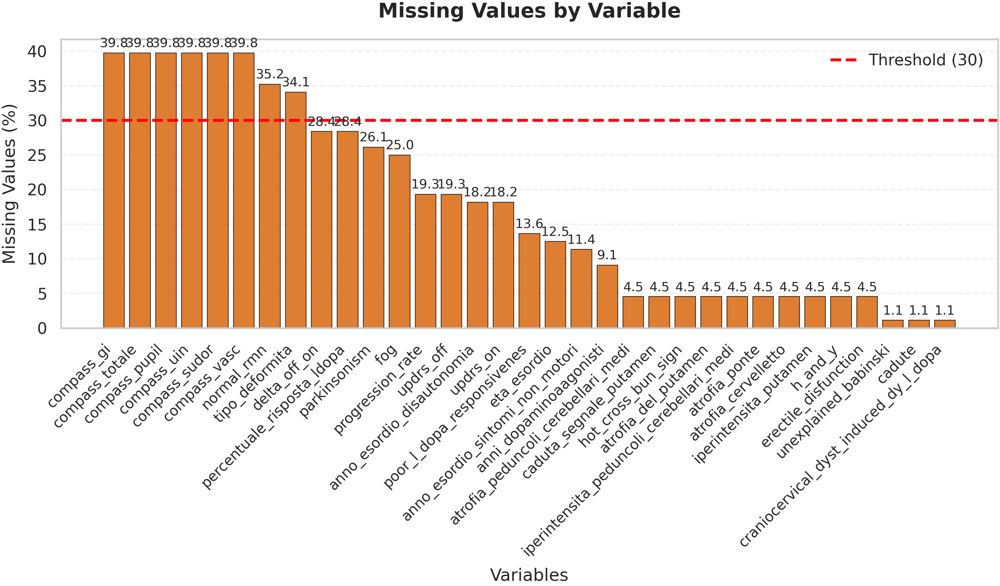

In [218]:
# Option 1: Individual plots
# plot_missingness_heatmap(df, save_path=f"{IMAGES_SAVE_PATH}/missingness_heatmap.png")
plot_missing_by_variable(df, show_percentage=True,
                         threshold=30,
                         save_path=f"{IMAGES_SAVE_PATH}/missing_by_variable.png")

# Option 2: Combined summary (recommended)
# plot_missingness_summary(df, save_path=f"{IMAGES_SAVE_PATH}/missingness_summary.png")

plt.show()

Removing columns with number of missings above a certain threshold

No columns exceeded the 30% missing value threshold.
delta_off_on                                25
percentuale_risposta_ldopa                  25
parkinsonism                                23
fog                                         22
updrs_off                                   17
progression_rate                            17
anno_esordio_disautonomia                   16
updrs_on                                    16
poor_l_dopa_responsivenes                   12
eta_esordio                                 11
anno_esordio_sintomi_non_motori             10
anni_dopaminoaagonisti                       8
h_and_y                                      4
iperintensita_putamen                        4
atrofia_peduncoli_cerebellari_medi           4
atrofia_del_putamen                          4
erectile_disfunction                         4
caduta_segnale_putamen                       4
hot_cross_bun_sign                           4
atrofia_ponte                                4
atrofia

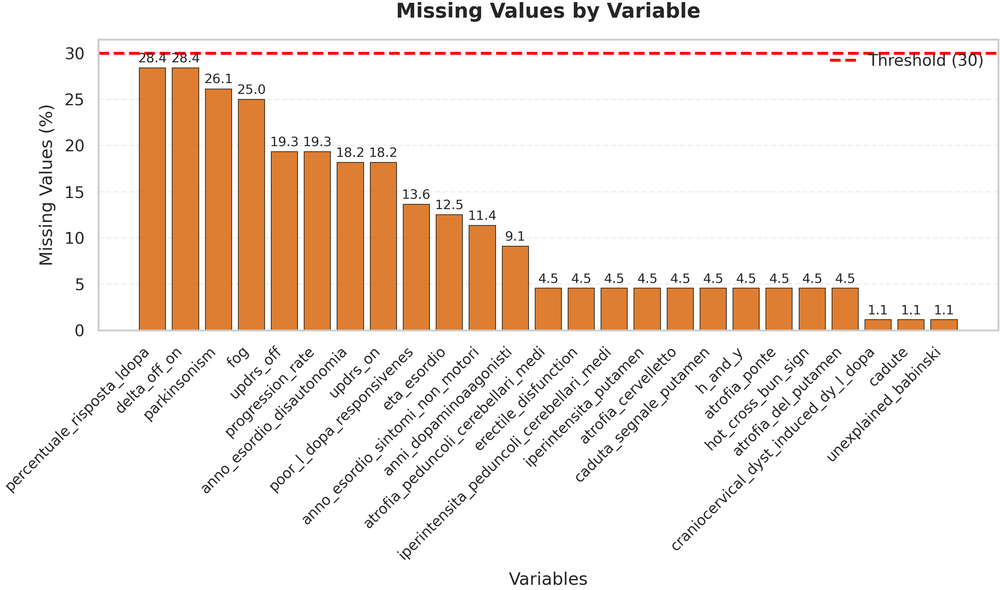

In [224]:
def remove_cols_by_missing(df, threshold):
    """
    Removes columns from a DataFrame if their percentage of missing values
    is greater than a specified threshold.

    Args:
        df (pd.DataFrame): The input DataFrame.
        threshold (float): The maximum allowed percentage of missing values
                           (e.g., 50 for 50%). Columns with a missing
                           percentage *greater* than this will be dropped.

    Returns:
        pd.DataFrame: A new DataFrame with the high-missing-value columns removed.
    """
    
    # Calculate the percentage of missing values for each column
    missing_percent = (df.isnull().sum() / len(df)) * 100
    
    # Create a list of columns to keep (those <= threshold)
    cols_to_keep = missing_percent[missing_percent <= threshold].index
    
    # Create a list of columns to drop (for a helpful message)
    cols_to_drop = missing_percent[missing_percent > threshold].index
    
    if not cols_to_drop.empty:
        print(f"Dropping columns with > {threshold}% missing values:")
        for col in cols_to_drop:
            print(f"- {col} ({missing_percent[col]:.2f}%)")
    else:
        print(f"No columns exceeded the {threshold}% missing value threshold.")
    
    # Return a new DataFrame containing only the columns to keep
    return df[cols_to_keep]


df = remove_cols_by_missing(df, 30)
plot_missing_by_variable(df, show_percentage=True,
                         threshold=30,
                         save_path=f"{IMAGES_SAVE_PATH}/missing_by_variable.png")
# df
# df.info()
# df.head()
num_cols_with_na = df.isna().sum()
num_cols_with_na[num_cols_with_na > 0]
print(num_cols_with_na[num_cols_with_na > 0].sort_values(ascending=False))

## New colums creation

creazione di nuove colonne: 'eta_attuale', 'ritardo_diagnostico', 'anni_dalla_diagnosi','ritardo_diagnostico',
    'percentuale_risposta_ldopa', 'ledd_per_anno', 'n_red_flags_msa', 'n_anomalie_mri', 
    'stadio_malattia', 'gruppo_eta', 
    'progression_rate'

In [228]:
print("=" * 80)
print("CREATING DERIVED COLUMNS FOR ENHANCED CLINICAL ANALYSIS")
print("=" * 80)

new_columns = [
    'eta_attuale', 'ritardo_diagnostico', 'anni_dalla_diagnosi','ritardo_diagnostico',
    'percentuale_risposta_ldopa', 'ledd_per_anno', 'n_red_flags_msa', 'n_anomalie_mri', 
    'stadio_malattia', 'gruppo_eta', 
    'progression_rate'
]


current_year = 2025

# Convert 'Data di nascita' to datetime and extract year
df['anno_nascita'] = pd.to_datetime(df['data_di_nascita'], format='%d/%m/%Y', errors='coerce').dt.year
# Calculate current age
df['eta_attuale'] = current_year - df['anno_nascita']
# 1. TEMPORAL/AGE COLUMNS
print("\n📅 Creating temporal/age columns...")
df['eta_diagnosi'] = df['anno_diagnosi'] - df['anno_nascita']
df['anni_dalla_diagnosi'] = 2025 - df['anno_diagnosi']
df['ritardo_diagnostico'] = df['anno_diagnosi'] - df['anno_esordio_sintomi_motori']
# 2. CLINICAL COMPOSITE COLUMNS

# percentuale_risposta_ldopa: 
# Represents the percentage clinical improvement with L-Dopa,
# calculated as the percentage reduction in UPDRS (Unified Parkinson's Disease Rating Scale) score
# from OFF to ON medication state. This quantifies dopaminergic responsiveness,
# which is typically lower in atypical parkinsonism (e.g., MSA) than in PD.
# (Formula: (UPDRS_OFF - UPDRS_ON) / UPDRS_OFF * 100)
df['percentuale_risposta_ldopa'] = (
    (df['updrs_off'] - df['updrs_on']) / df['updrs_off'] * 100
)

# ledd_per_anno:
# The Levodopa Equivalent Daily Dose (LEDD) normalized by disease duration in years.
# !NOTE: to check what is meant by ledd in the dataset, how is it calculated, does it make sense to normalize it by the disease duration?
# This helps assess the cumulative dopaminergic treatment load relative to the progression,
# facilitating between-patient comparisons and correlating dopaminergic load with severity or complications.
df['ledd_per_anno'] = df['ledd'] / df['durata_malattia']

# 3. RED FLAGS AND SYMPTOM COUNTS
print(" Counting MSA red flags and symptoms...")
msa_red_flags = [
    'poor_l_dopa_responsivenes', 'cerebellar_syndrome', 
    'rapid_progression_w_3_yrs', 'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset',
    'severe_speech_impairement_w_3_yrs', 'severe_dysphagia_w_3_yrs', 'stridor'
]

df['n_red_flags_msa'] = df[msa_red_flags].sum(axis=1)

mri_abnormalities = [
    'atrofia_del_putamen', 'atrofia_peduncoli_cerebellari_medi',
    'atrofia_ponte', 'atrofia_cervelletto', 'hot_cross_bun_sign',
    'iperintensita_putamen', 'caduta_segnale_putamen'
]
df['n_anomalie_mri'] = df[mri_abnormalities].sum(axis=1)

# 4. DISEASE STAGE CATEGORIES
print(" Creating disease stage categories...")
df['stadio_malattia'] = pd.cut(df['durata_malattia'], 
                              bins=[0, 2, 5, float('inf')],
                              labels=['Early (≤2y)', 'Mid (2-5y)', 'Late (>5y)'])

df['gruppo_eta'] = pd.cut(df['eta_attuale'], 
                         bins=[0, 50, 60, 70, float('inf')],
                         labels=['<50', '50-60', '60-70', '>70'])

# 5. PROGRESSION RATE
# =============================================================================
# PROGRESSION RATE CALCULATION
# =============================================================================
# 
# RATIONALE FOR PROGRESSION RATE = UPDRS_OFF / DURATA_MALATTIA:
#
# This metric quantifies the rate of disease progression as "UPDRS points per year"
# and is grounded in clinical neurology research for neurodegenerative diseases.
#
# SCIENTIFIC BACKGROUND:
# 1. UPDRS (Unified Parkinson's Disease Rating Scale) Part III (motor examination)
#    ranges from 0-108 points, with higher scores indicating greater motor impairment.
#    It is the gold standard for quantifying motor severity in parkinsonism.
#
# 2. Disease duration (durata_malattia) represents the time elapsed since symptom
#    onset, providing a temporal baseline for progression assessment.
#
# 3. Dividing cumulative motor impairment (UPDRS) by disease duration yields an
#    average annual rate of deterioration, enabling:
#    - Cross-patient comparison independent of disease stage
#    - Differentiation between slow vs. rapid progressors
#    - Clinical phenotype characterization (crucial for MSA vs PD distinction)
#
# CLINICAL RELEVANCE FOR MSA vs PD:
# - MSA typically progresses FASTER than PD (Gilman et al., Neurology 2008)
# - MSA: ~6-10 UPDRS points/year (rapid progression)
# - PD:  ~1-3 UPDRS points/year (slower progression)
# - This metric is a key differential diagnostic feature
#
# LITERATURE SUPPORT:
# - Wenning et al. (2013, Lancet Neurology): MSA shows rapid progression within
#   first 3 years, with median survival 6-9 years vs 15+ years for PD
# - Low et al. (2015, Neurology): UPDRS progression rate correlates with survival
#   and can predict MSA subtype severity
#
# INTERPRETATION:
# - Progression rate < 5 points/year  → Slow progressor (typical PD)
# - Progression rate 5-10 points/year → Moderate progressor
# - Progression rate > 10 points/year → Rapid progressor (typical MSA)
#
# !NOTE:LIMITATIONS:
# - Assumes linear progression (actual progression may be non-linear)
# - UPDRS_OFF measurement timing may vary across patients NOTE: i dont know when the UPDRS_OFF is measured
# - Does not account for treatment effects or comorbidities
# - Sensitive to measurement error in early disease (small denominator)
#
# ALTERNATIVE APPROACHES (for future consideration):
# - Annualized change: (UPDRS_current - UPDRS_baseline) / years_between_measurements
# - H&Y stage progression rate: H&Y / durata_malattia
# - Composite score: (UPDRS + COMPASS + MRI abnormalities) / durata_malattia
# =============================================================================
#Lascia il tempo che trova.... see limitations
df['progression_rate'] = df['updrs_off'] / df['durata_malattia']

print(f"\nTotal columns now: {len(df.columns)}")

# Display summary of new key columns
print("\n" + "=" * 80)
print("KEY DERIVED COLUMNS SUMMARY")
print("=" * 80)
# print(df[new_columns].describe())

#showing the new columns


# print("\nNuove colonne aggiunte:")
# print(new_columns)
# print("\nPreview delle nuove colonne:")
display(df[new_columns].head(6))
# Count the number of patients with age greater than 80 years
n_over_80 = (df['eta_attuale'] > 80).sum()
print(f"Numero di pazienti con età superiore a 80 anni: {n_over_80}")

CREATING DERIVED COLUMNS FOR ENHANCED CLINICAL ANALYSIS

📅 Creating temporal/age columns...
 Counting MSA red flags and symptoms...
 Creating disease stage categories...

Total columns now: 72

KEY DERIVED COLUMNS SUMMARY


,eta_attuale,ritardo_diagnostico,anni_dalla_diagnosi,ritardo_diagnostico,percentuale_risposta_ldopa,ledd_per_anno,n_red_flags_msa,n_anomalie_mri,stadio_malattia,gruppo_eta,progression_rate
codice,,,,,,,,,,,
5435,75,2,3,2,28.333333,425.000000,3.0,2.0,Early (≤2y),>70,30.000000
5717,52,2,3,2,17.647059,175.000000,2.0,1.0,Mid (2-5y),50-60,11.333333
5745,66,1,3,1,20.000000,200.000000,2.0,3.0,Early (≤2y),60-70,30.000000
5753,67,3,3,3,14.285714,306.666667,3.0,3.0,Mid (2-5y),60-70,14.000000
5767,65,3,3,3,8.888889,184.000000,4.0,0.0,Mid (2-5y),60-70,15.000000
5776,75,7,3,7,15.789474,117.857143,4.0,1.0,Late (>5y),>70,8.142857


Numero di pazienti con età superiore a 80 anni: 4


In [229]:
df.columns

Index(['sesso', 'data_di_nascita', 'diagnosi_di_invio', 'diagnosi_definita',
       'anno_diagnosi', 'anno_esordio_sintomi_motori',
       'anno_esordio_sintomi_non_motori', 'anno_esordio_disautonomia',
       'eta_esordio', 'durata_malattia', 'anni_l_dopa',
       'anni_dopaminoaagonisti', 'ledd', 'updrs_on', 'updrs_off',
       'delta_off_on', 'h_and_y', 'deambulaz_autonoma', 'deambulaz_appoggio',
       'carrozzina', 'cadute', 'parkinsonism', 'poor_l_dopa_responsivenes',
       'cerebellar_syndrome', 'rapid_progression_w_3_yrs',
       'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset',
       'craniocervical_dyst_induced_dy_l_dopa',
       'severe_speech_impairement_w_3_yrs', 'severe_dysphagia_w_3_yrs',
       'unexplained_babinski', 'jerky_myoclonic_postural_or_kinetic_tremor',
       'postural_deformities', 'fog', 'unexplained_voiding_difficulties',
       'unexplained_urinary_urge_incontinence', 'anamnestic_oh', 'stridor',
       'inspiratory_sighs', 'russamento_os

## 🔍 Outlier Detection using Tukey's Fences

**Objective**: Identify extreme values in key continuous clinical variables that may represent:
- Data entry errors
- Truly exceptional clinical cases
- Biologically implausible measurements

**Method**: Tukey's Fences
- Lower fence = Q1 − 1.5 × IQR  
- Upper fence = Q3 + 1.5 × IQR
- Values outside these fences are flagged as outliers

**Why Important for ML**:
- Outliers can severely impact model training
- Need to decide: remove, cap, or keep them based on clinical validity


In [234]:
# Define key continuous variables for outlier detection
KEY_CONTINUOUS_VARS = [
    # Demographics and disease timing
    'eta_attuale',           # Current age
    'eta_esordio',           # Age at onset
    'eta_diagnosi',          # Age at diagnosis
    'durata_malattia',       # Disease duration (years)
    'ritardo_diagnostico',   # Diagnostic delay (years)
    
    # Motor symptoms and progression
    'updrs_on',              # UPDRS in ON state
    'updrs_off',             # UPDRS in OFF state
    'delta_off_on',          # Delta between OFF and ON
    'h_and_y',               # Hoehn & Yahr stage
    'progression_rate',      # Disease progression rate
    
    # Medication
    'ledd',                  # L-DOPA equivalent daily dose
    'anni_l_dopa',           # Years on L-DOPA
    'anni_dopaminoaagonisti',# Years on dopamine agonists
    'ledd_per_anno',         # LEDD per year
    'percentuale_risposta_ldopa',  # L-DOPA response (%)
    
    # Clinical scores  
    'n_red_flags_msa',       # Number of MSA red flags
    'n_anomalie_mri',        # Number of MRI abnormalities
]

# Variable display names (for publication-ready plots)
VAR_DISPLAY_NAMES = {
    'eta_attuale': 'Current Age (years)',
    'eta_esordio': 'Age at Onset (years)',
    'eta_diagnosi': 'Age at Diagnosis (years)',
    'durata_malattia': 'Disease Duration (years)',
    'ritardo_diagnostico': 'Diagnostic Delay (years)',
    'updrs_on': 'UPDRS ON',
    'updrs_off': 'UPDRS OFF',
    'delta_off_on': 'UPDRS Δ(OFF-ON)',
    'h_and_y': 'Hoehn & Yahr Stage',
    'progression_rate': 'Progression Rate',
    'ledd': 'LEDD (mg/day)',
    'anni_l_dopa': 'Years on L-DOPA',
    'anni_dopaminoaagonisti': 'Years on DA Agonists',
    'ledd_per_anno': 'LEDD per Year',
    'percentuale_risposta_ldopa': 'L-DOPA Response (%)',
    'n_red_flags_msa': 'N° MSA Red Flags',
    'n_anomalie_mri': 'N° MRI Abnormalities',
}

print(f"✅ Selected {len(KEY_CONTINUOUS_VARS)} continuous variables for outlier detection")


✅ Selected 17 continuous variables for outlier detection


In [248]:
def detect_outliers_tukey(df, columns, k=1.5, by_group=None):
    """
    Detect outliers using Tukey's fences (IQR method).
    
    Tukey's fences define outliers as values outside:
    - Lower fence = Q1 - k × IQR
    - Upper fence = Q3 + k × IQR
    
    Where IQR = Q3 - Q1 (interquartile range).
    
    Parameters
    ----------
    df : pd.DataFrame
        Input dataframe
    columns : list of str
        Column names to check for outliers
    k : float, default=1.5
        Multiplier for IQR. Standard values:
        - 1.5: mild outliers (default, Tukey's original)
        - 3.0: extreme outliers
    by_group : str, optional
        Column name to group by (e.g., 'diagnosi_definita').
        If provided, outliers are detected within each group.
    
    Returns
    -------
    outlier_summary : pd.DataFrame
        Summary table with outlier statistics per variable
    outlier_details : dict
        Dictionary mapping column names to DataFrames containing
        outlier rows and metadata
    
    Examples
    --------
    >>> summary, details = detect_outliers_tukey(
    ...     df, 
    ...     ['eta_attuale', 'durata_malattia'],
    ...     by_group='diagnosi_definita'
    ... )
    """
    import numpy as np
    import pandas as pd

    # -- OUTLIER DETECTION: OUTPUTS EXPLAINED --
    # outlier_summary: a list of dictionaries (one per variable/group) with
    #   summary statistics for Tukey outlier detection (Q1, Q3, IQR, boundaries,
    #   counts, etc), returned as a DataFrame for downstream tabular analysis.
    
    # outlier_details: a dict mapping each analyzed column name to a DataFrame 
    #   of the rows in df containing outlier values for that column (either
    #   across the whole sample or per group if by_group is specified), with 
    #   an additional 'outlier_in_column' column specifying the originating field.
    # This facilitates further review, export, or traceability of individual 
    #   outlier patient records for each biomarker/feature.
    
    outlier_summary = [] 
    outlier_details = {}
    
    for col in columns:
        if col not in df.columns:
            print(f"  Column '{col}' not found, skipping.")
            continue
        
        # Get numeric data, drop NaN
        data = df[col].dropna()
        
        if len(data) == 0:
            print(f" Column '{col}' has no valid data, skipping.")
            continue
        
        if by_group and by_group in df.columns:
            # Detect outliers per group (each diagnosis, etc)
            groups = df[by_group].unique()
            groups = groups[pd.notna(groups)] # remove Na values
                
            all_outlier_indices = []
            group_stats = []
            
            for group in groups:
                group_data = df[df[by_group] == group][col].dropna()
                
                if len(group_data) < 4:  # Need at least 4 points for IQR
                    continue
                
                Q1 = group_data.quantile(0.25)
                Q3 = group_data.quantile(0.75)
                IQR = Q3 - Q1
                
                lower_fence = Q1 - k * IQR
                upper_fence = Q3 + k * IQR
                
                # Find outliers in this group
                group_outlier_mask = (
                    (group_data < lower_fence) | (group_data > upper_fence)
                )
                outlier_indices = group_data[group_outlier_mask].index
                all_outlier_indices.extend(outlier_indices)
                
                n_outliers = len(outlier_indices)
                if n_outliers > 0:
                    group_stats.append({
                        'Variable': col,
                        'Group': group,
                        'N': len(group_data),
                        'Q1': Q1,
                        'Q3': Q3,
                        'IQR': IQR,
                        'Lower_Fence': lower_fence,
                        'Upper_Fence': upper_fence,
                        'N_Outliers': n_outliers,
                        'Outlier_%': (n_outliers / len(group_data)) * 100
                    })
            
            # Combine all groups
            if all_outlier_indices:
                # DataFrame of all group outliers for this col, with a marker column
                outlier_details[col] = df.loc[all_outlier_indices, :].copy()
                outlier_details[col]['outlier_in_column'] = col
                outlier_summary.extend(group_stats)
            
        else:
            # Detect outliers globally (no grouping)
            Q1 = data.quantile(0.25)
            Q3 = data.quantile(0.75)
            IQR = Q3 - Q1
            
            lower_fence = Q1 - k * IQR
            upper_fence = Q3 + k * IQR
            
            # Find outliers
            outlier_mask = (data < lower_fence) | (data > upper_fence)
            outlier_indices = data[outlier_mask].index
            n_outliers = len(outlier_indices)
            
            outlier_summary.append({
                'Variable': col,
                'Group': 'All',
                'N': len(data),
                'Q1': Q1,
                'Q3': Q3,
                'IQR': IQR,
                'Lower_Fence': lower_fence,
                'Upper_Fence': upper_fence,
                'N_Outliers': n_outliers,
                'Outlier_Pct': (n_outliers / len(data)) * 100
            })
            
            if n_outliers > 0:
                outlier_details[col] = df.loc[outlier_indices, :].copy()
                outlier_details[col]['outlier_in_column'] = col
    
    summary_df = pd.DataFrame(outlier_summary)
    
    return summary_df, outlier_details

In [258]:
# Run outlier detection globally (across all diagnoses)
print("="*70)
print("🔍 DETECTING OUTLIERS - GLOBAL (All Diagnoses Combined)")
print("="*70)

outlier_summary_global, outlier_details_global = detect_outliers_tukey(
    df=df,
    columns=KEY_CONTINUOUS_VARS,
    k=3,
    by_group='diagnosi_definita'
)

outlier_summary_global
# outlier_details_global

🔍 DETECTING OUTLIERS - GLOBAL (All Diagnoses Combined)


,Variable,Group,N,Q1,Q3,IQR,Lower_Fence,Upper_Fence,N_Outliers,Outlier_%
0,durata_malattia,MSA-P,33,3.000000,5.000000,2.000000,-3.000000,11.000000,1,3.030303
1,ritardo_diagnostico,MSA-P,33,2.000000,4.000000,2.000000,-4.000000,10.000000,1,3.030303
2,delta_off_on,MSA-P,30,-20.307500,-12.725000,7.582500,-43.055000,10.022500,1,3.333333
3,h_and_y,PD,27,0.000000,0.000000,0.000000,0.000000,0.000000,4,14.814815
4,progression_rate,MSA-C,20,5.937500,12.750000,6.812500,-14.500000,33.187500,1,5.000000
5,progression_rate,PD,21,3.777778,8.400000,4.622222,-10.088889,22.266667,1,4.761905
6,ledd,MSA-C,26,0.000000,287.500000,287.500000,-862.500000,1150.000000,1,3.846154
7,anni_l_dopa,MSA-P,33,1.000000,3.000000,2.000000,-5.000000,9.000000,1,3.030303
8,anni_l_dopa,MSA-C,26,0.000000,1.000000,1.000000,-3.000000,4.000000,1,3.846154
9,anni_dopaminoaagonisti,MSA-C,26,0.000000,0.000000,0.000000,0.000000,0.000000,1,3.846154


In [259]:

# Filter to show only variables with outliers
outliers_found = outlier_summary_global[outlier_summary_global['N_Outliers'] > 0].copy()

if len(outliers_found) > 0:
    # Format for display
    outliers_found = outliers_found.sort_values('Outlier_%', ascending=False)
    
    # Round numeric columns
    for col in ['Q1', 'Q3', 'IQR', 'Lower_Fence', 'Upper_Fence']:
        outliers_found[col] = outliers_found[col].round(2)
    outliers_found['Outlier_%'] = outliers_found['Outlier_%'].round(1)
    
    print(f"\n✅ Found outliers in {len(outliers_found)} variables:\n")
    display(outliers_found)
else:
    print("\n✅ No outliers detected with k=1.5")



✅ Found outliers in 13 variables:



,Variable,Group,N,Q1,Q3,IQR,Lower_Fence,Upper_Fence,N_Outliers,Outlier_%
3,h_and_y,PD,27,0.00,0.00,0.00,0.00,0.00,4,14.8
12,n_anomalie_mri,PD,29,1.00,1.00,0.00,1.00,1.00,4,13.8
4,progression_rate,MSA-C,20,5.94,12.75,6.81,-14.50,33.19,1,5.0
5,progression_rate,PD,21,3.78,8.40,4.62,-10.09,22.27,1,4.8
8,anni_l_dopa,MSA-C,26,0.00,1.00,1.00,-3.00,4.00,1,3.8
9,anni_dopaminoaagonisti,MSA-C,26,0.00,0.00,0.00,0.00,0.00,1,3.8
6,ledd,MSA-C,26,0.00,287.50,287.50,-862.50,1150.00,1,3.8
10,ledd_per_anno,PD,29,80.00,156.25,76.25,-148.75,385.00,1,3.4
2,delta_off_on,MSA-P,30,-20.31,-12.72,7.58,-43.06,10.02,1,3.3
11,percentuale_risposta_ldopa,MSA-P,30,12.73,20.31,7.58,-10.01,43.05,1,3.3


✅ Table saved: images/tables/outlier_summary_table.png


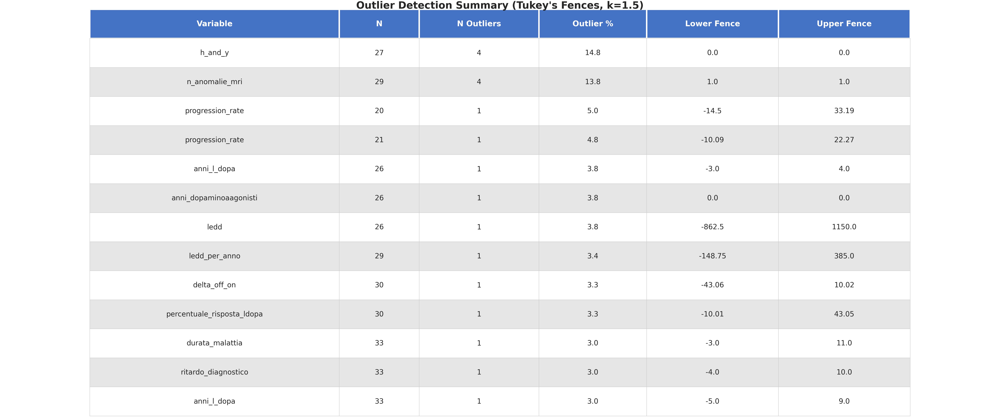

In [260]:
# Create summary table as image
if len(outliers_found) > 0:
    table_df = outliers_found[[
        'Variable', 'N', 'N_Outliers', 'Outlier_%',
        'Lower_Fence', 'Upper_Fence'
    ]].copy()
    
    table_df.columns = [
        'Variable', 'N', 'N Outliers', 'Outlier %',
        'Lower Fence', 'Upper Fence'
    ]
    
    # Reset index for clean table
    table_df = table_df.reset_index(drop=True)
    
    create_table_image(
        df_table=table_df,
        title="Outlier Detection Summary (Tukey's Fences, k=1.5)",
        filename="outlier_summary_table.png"
    )



📊 Creating outlier visualizations...


/tmp/ipykernel_11747/2755522707.py:48: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_11747/2755522707.py:48: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_11747/2755522707.py:48: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_11747/2755522707.py:48: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_11747/2755522707.py:48: MatplotlibDeprecationWarning: The 'labels' parameter 

✅ Boxplot saved: /home/zano/Documents/TESI/FOLDER_CINECA/images/outliers_boxplots.png


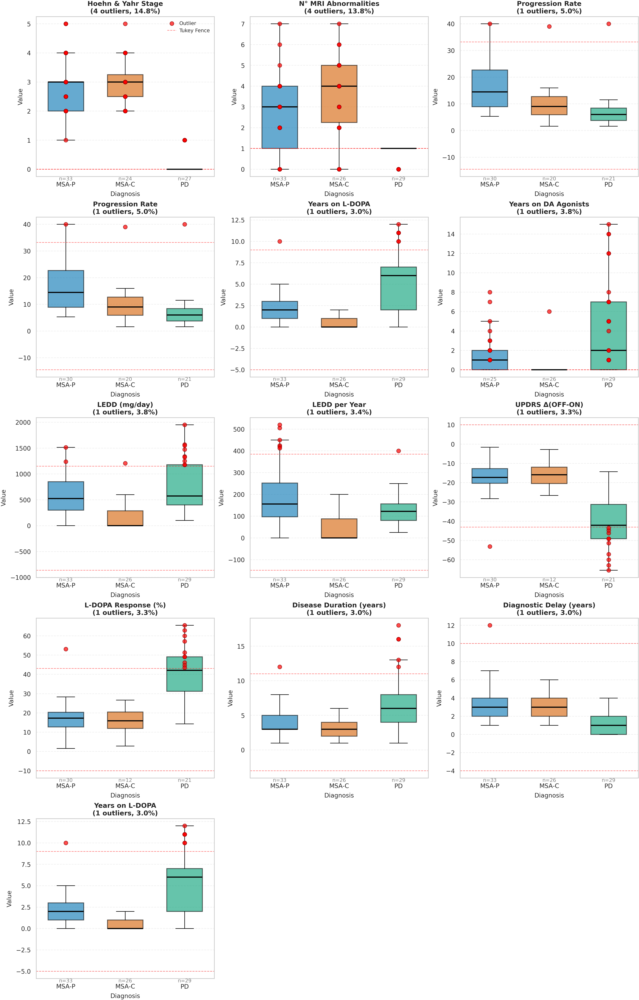

In [ ]:
# Visualize outliers with boxplots
print("\n📊 Creating outlier visualizations...")

# Filter variables that have outliers
vars_with_outliers = outliers_found['Variable'].tolist()

if len(vars_with_outliers) > 0:
    # Create subplot grid
    n_vars = len(vars_with_outliers)
    n_cols = 3
    n_rows = int(np.ceil(n_vars / n_cols))
    
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(16, 5 * n_rows),
        constrained_layout=True
    )
    
    # Flatten axes
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    # Color palette for diagnoses
    diagnosis_colors = {
        'MSA-P': sm.palette[0],  # Blue
        'MSA-C': sm.palette[1],  # Orange
        'PD': sm.palette[2]      # Green
    }
    
    for idx, outlier_var in enumerate(vars_with_outliers):
        ax = axes[idx]
        
        # Prepare data
        plot_data = df[[outlier_var, 'diagnosi_definita']].dropna()
        
        # Get outlier info
        outlier_info = outlier_summary_global[
            outlier_summary_global['Variable'] == outlier_var
        ].iloc[0]
        lower_fence = outlier_info['Lower_Fence']
        upper_fence = outlier_info['Upper_Fence']
        
        # Create boxplot
        diagnoses_present = [d for d in ['MSA-P', 'MSA-C', 'PD']
                            if d in plot_data['diagnosi_definita'].values]
        
        bp = ax.boxplot(
            [plot_data[plot_data['diagnosi_definita'] == diag][outlier_var].values
             for diag in diagnoses_present],
            positions=range(len(diagnoses_present)),
            labels=diagnoses_present,
            patch_artist=True,
            widths=0.6,
            showfliers=False  # We'll add custom outlier markers
        )
        
        # Color boxes
        for patch, diag in zip(bp['boxes'], diagnoses_present):
            patch.set_facecolor(diagnosis_colors[diag])
            patch.set_alpha(0.6)
            patch.set_edgecolor('black')
            patch.set_linewidth(1.5)
        
        # Style medians
        for median in bp['medians']:
            median.set_color('black')
            median.set_linewidth(2)
        
        # Add outliers as red points
        for i, diag in enumerate(diagnoses_present):
            diag_data = plot_data[plot_data['diagnosi_definita'] == diag][outlier_var]
            outliers = diag_data[
                (diag_data < lower_fence) | (diag_data > upper_fence)
            ]
            
            if len(outliers) > 0:
                ax.scatter(
                    [i] * len(outliers),
                    outliers,
                    color='red',
                    s=50,
                    alpha=0.7,
                    marker='o',
                    edgecolors='darkred',
                    linewidths=1,
                    zorder=10,
                    label='Outlier' if idx == 0 and i == 0 else ''
                )
        
        # Add fence lines
        ax.axhline(
            lower_fence, color='red', linestyle='--',
            linewidth=1, alpha=0.5,
            label='Tukey Fence' if idx == 0 else ''
        )
        ax.axhline(
            upper_fence, color='red', linestyle='--',
            linewidth=1, alpha=0.5
        )
        
        # Labels
        display_name = VAR_DISPLAY_NAMES.get(outlier_var, outlier_var)
        ax.set_title(
            f"{display_name}\n({outlier_info['N_Outliers']} outliers, "
            f"{outlier_info['Outlier_%']:.1f}%)",
            fontsize=12,
            fontweight='bold'
        )
        ax.set_ylabel('Value', fontsize=11)
        ax.set_xlabel('Diagnosis', fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add sample sizes
        for i, diag in enumerate(diagnoses_present):
            n = len(plot_data[plot_data['diagnosi_definita'] == diag])
            ax.text(
                i, ax.get_ylim()[0],
                f'n={n}',
                ha='center', va='top',
                fontsize=9,
                color='gray'
            )
    
    # Remove empty subplots
    for idx in range(n_vars, len(axes)):
        fig.delaxes(axes[idx])
    
    # Add legend to first subplot
    if n_vars > 0:
        axes[0].legend(loc='upper right', fontsize=9)
    
    # Save figure
    fig.savefig(
        f'{IMAGES_SAVE_PATH}/outliers_boxplots.png',
        dpi=300,
        bbox_inches='tight',
        facecolor='white'
    )
    print(f"✅ Boxplot saved: {IMAGES_SAVE_PATH}/outliers_boxplots.png")
    plt.show()
    plt.close()
else:
    print("No outliers to visualize")

## 🔎 Detailed Outlier Inspection
 This code performs a detailed inspection of the previously identified outliers for each variable flagged in the dataset.
 For each variable with outliers:
 - It prints the variable name and the count of detected outliers.
 - It displays a concise dataframe containing the diagnosis, the outlier value, current age (`eta_attuale`), disease duration (`durata_malattia`), and clinical stage (`h_and_y`), if these columns are available.

In [264]:


# Detailed outlier inspection
print("\n" + "="*70)
print("🔬 DETAILED OUTLIER INSPECTION")
print("="*70)

for outlier_var, outlier_df in outlier_details_global.items():
    if len(outlier_df) > 0:
        outlier_variable = VAR_DISPLAY_NAMES.get(outlier_var, outlier_var)
        print(f"\n📌 Variable: {outlier_variable}")
        print(f"   Found {len(outlier_df)} outlier(s)")
        
        # Show relevant columns
        display_cols = [
            'diagnosi_definita', outlier_var, 'eta_attuale',
            'durata_malattia', 'h_and_y'
        ]
        display_cols = [c for c in display_cols if c in outlier_df.columns]
        
        display(outlier_df[display_cols])

print("\n✅ Outlier analysis complete!")



🔬 DETAILED OUTLIER INSPECTION

📌 Variable: Disease Duration (years)
   Found 1 outlier(s)


,diagnosi_definita,durata_malattia,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6663,MSA-P,12,78,12,4.0



📌 Variable: Diagnostic Delay (years)
   Found 1 outlier(s)


,diagnosi_definita,ritardo_diagnostico,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6663,MSA-P,12,78,12,4.0



📌 Variable: UPDRS Δ(OFF-ON)
   Found 1 outlier(s)


,diagnosi_definita,delta_off_on,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6308,MSA-P,-53.13,55,7,3.0



📌 Variable: Hoehn & Yahr Stage
   Found 4 outlier(s)


,diagnosi_definita,h_and_y,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6008,PD,1.0,62,18,1.0
6366,PD,1.0,58,7,1.0
6383,PD,1.0,58,8,1.0
6424,PD,1.0,57,12,1.0



📌 Variable: Progression Rate
   Found 2 outlier(s)


,diagnosi_definita,progression_rate,eta_attuale,durata_malattia,h_and_y
codice,,,,,
7179,MSA-C,39.0,75,1,4.0
7155,PD,40.0,54,1,0.0



📌 Variable: LEDD (mg/day)
   Found 1 outlier(s)


,diagnosi_definita,ledd,eta_attuale,durata_malattia,h_and_y
codice,,,,,
5996,MSA-C,1208.0,58,8,4.0



📌 Variable: Years on L-DOPA
   Found 2 outlier(s)


,diagnosi_definita,anni_l_dopa,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6663,MSA-P,10,78,12,4.0
5996,MSA-C,6,58,8,4.0



📌 Variable: Years on DA Agonists
   Found 1 outlier(s)


,diagnosi_definita,anni_dopaminoaagonisti,eta_attuale,durata_malattia,h_and_y
codice,,,,,
5996,MSA-C,6.0,58,8,4.0



📌 Variable: LEDD per Year
   Found 1 outlier(s)


,diagnosi_definita,ledd_per_anno,eta_attuale,durata_malattia,h_and_y
codice,,,,,
7461,PD,400.0,66,1,0.0



📌 Variable: L-DOPA Response (%)
   Found 1 outlier(s)


,diagnosi_definita,percentuale_risposta_ldopa,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6308,MSA-P,53.125,55,7,3.0



📌 Variable: N° MRI Abnormalities
   Found 4 outlier(s)


,diagnosi_definita,n_anomalie_mri,eta_attuale,durata_malattia,h_and_y
codice,,,,,
6008,PD,0.0,62,18,1.0
6323,PD,0.0,81,8,0.0
6690,PD,0.0,66,16,0.0
7787,PD,0.0,59,4,0.0



✅ Outlier analysis complete!


### 📋 Recommendations for Handling Outliers

**For Machine Learning Models:**

1. **Keep Outliers If:**
   - Biologically plausible (e.g., early-onset patient at age 42)
   - Represent true clinical variability
   - Small dataset where removing data hurts statistical power

2. **Remove Outliers If:**
   - Clear data entry errors (e.g., age = 200 years)
   - Impossible values (e.g., negative disease duration)
   - Severely distort model training

3. **Cap (Winsorize) Outliers If:**
   - Want to retain information but reduce extreme influence
   - Replace outliers with fence values (Q1 - 1.5×IQR or Q3 + 1.5×IQR)

4. **Use Robust Methods:**
   - Tree-based models (Random Forest, XGBoost) are naturally resistant to outliers
   - StandardScaler vs. RobustScaler for preprocessing
   - Median-based metrics instead of mean-based

**Clinical Interpretation:**
- MSA and PD are heterogeneous diseases
- Some "outliers" may represent rare but valid phenotypes
- Always cross-check with clinical notes before removing data

**Next Steps:**
1. Review each flagged case with domain expert
2. Decide on case-by-case basis whether to keep/remove/cap
3. Document decisions for reproducibility
4. Consider sensitivity analysis (with vs. without outliers)


In [ ]:
is_included = set(red_flags) & set(df.columns.tolist())
is_included_mri = set(mri_findings) & set(df.columns.tolist())

print(f"Red flags included: {is_included}")
print(f"MRI findings included: {is_included_mri}")

is_included = set(red_flags).issubset(df.columns.tolist())
is_included_mri = set(mri_findings).issubset(df.columns.tolist())

print(f"Red flags included: {is_included}") 
print(f"MRI findings included: {is_included_mri}")

missing_red_flags = set(red_flags) - set(df.columns.tolist())
missing_mri_findings = set(mri_findings) - set(df.columns.tolist())

print(f"Missing red flags: {missing_red_flags}")
print(f"Missing MRI findings: {missing_mri_findings}")








Red flags included: {'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset', 'cold_discolored_hands_and_feet', 'unexplained_voiding_difficulties', 'unexplained_babinski', 'rapid_progression_w_3_yrs', 'craniocervical_dyst_induced_dy_l_dopa', 'severe_dysphagia_w_3_yrs', 'unexplained_urinary_urge_incontinence', 'jerky_myoclonic_postural_or_kinetic_tremor', 'inspiratory_sighs', 'postural_deformities', 'pathologic_laughter_or_crying', 'stridor'}
MRI findings included: {'atrofia_cervelletto', 'iperintensita_peduncoli_cerebellari_medi', 'atrofia_peduncoli_cerebellari_medi', 'atrofia_del_putamen', 'atrofia_ponte', 'hot_cross_bun_sign', 'iperintensita_putamen', 'caduta_segnale_putamen'}
Red flags included: False
MRI findings included: True
Missing red flags: {'poor_l_dopa_responsiveness', 'severe_speech_impairment_w_3_yrs'}
Missing MRI findings: set()


# Visualizations

In [230]:
df

,sesso,data_di_nascita,diagnosi_di_invio,diagnosi_definita,anno_diagnosi,anno_esordio_sintomi_motori,anno_esordio_sintomi_non_motori,anno_esordio_disautonomia,eta_esordio,durata_malattia,...,eta_diagnosi,anni_dalla_diagnosi,ritardo_diagnostico,percentuale_risposta_ldopa,ledd_per_anno,n_red_flags_msa,n_anomalie_mri,stadio_malattia,gruppo_eta,progression_rate
codice,,,,,,,,,,,,,,,,,,,,,
5435,F,15/04/1950,MSA-P,MSA-P,2022,2020,2020.0,2020.0,70.0,2,...,72,3,2,28.333333,425.000000,3.0,2.0,Early (≤2y),>70,30.000000
5717,M,25/02/1973,MSA-P,MSA-P,2022,2020,2019.0,2019.0,46.0,3,...,49,3,2,17.647059,175.000000,2.0,1.0,Mid (2-5y),50-60,11.333333
5745,F,15/08/1959,MSA-P,MSA-P,2022,2021,2021.0,NaN,62.0,1,...,63,3,1,20.000000,200.000000,2.0,3.0,Early (≤2y),60-70,30.000000
5753,F,09/04/1958,MSA-P,MSA-P,2022,2019,2019.0,2019.0,61.0,3,...,64,3,3,14.285714,306.666667,3.0,3.0,Mid (2-5y),60-70,14.000000
5767,F,16/09/1960,MSA-P,MSA-P,2022,2019,2021.0,2022.0,59.0,3,...,62,3,3,8.888889,184.000000,4.0,0.0,Mid (2-5y),60-70,15.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7461,M,04/01/1959,PD,PD,2024,2023,2024.0,2024.0,NaN,1,...,65,1,1,NaN,400.000000,1.0,1.0,Early (≤2y),60-70,NaN
7544,M,19/08/1977,PD,PD,2024,2024,2024.0,2024.0,NaN,1,...,47,1,0,NaN,150.000000,1.0,1.0,Early (≤2y),<50,NaN
7781,F,23/10/1958,PD,PD,2024,2023,NaN,NaN,NaN,2,...,66,1,1,NaN,60.000000,1.0,1.0,Early (≤2y),60-70,NaN


In [175]:
# Prepare counts by diagnosis and sex
data_counts = (
    pd.crosstab(df['diagnosi_definita'], df['sesso'])
    .reindex(CLASSES_ORDER, fill_value=0)
)

msa_counts = data_counts.loc['MSA-P'] + data_counts.loc['MSA-C']
pd_counts = data_counts.loc['PD']

# Check if the sum of all elements in data_counts equals the number of rows in df
total_from_crosstab = data_counts.values.sum()
if total_from_crosstab == len(df):
    print(f"Check passed: sum of counts ({total_from_crosstab}) == number of patients in df ({len(df)})")
else:
    raise ValueError(f"WARNING: sum of counts ({total_from_crosstab}) != number of patients in df ({len(df)})")
    
data_counts
# print(data_counts.index)

Check passed: sum of counts (88) == number of patients in df (88)


sesso,F,M
diagnosi_definita,,
MSA-P,19,14
MSA-C,13,13
PD,4,25


✅ Table saved: /home/zano/Documents/TESI/FOLDER_CINECA/images/DIAGNOSI_COUNT_TABLE.png


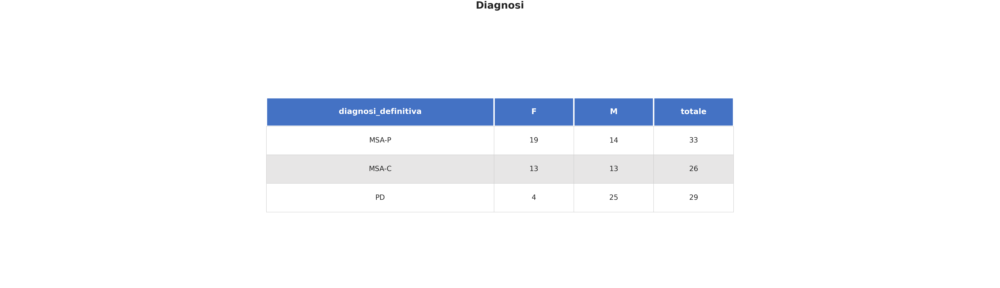

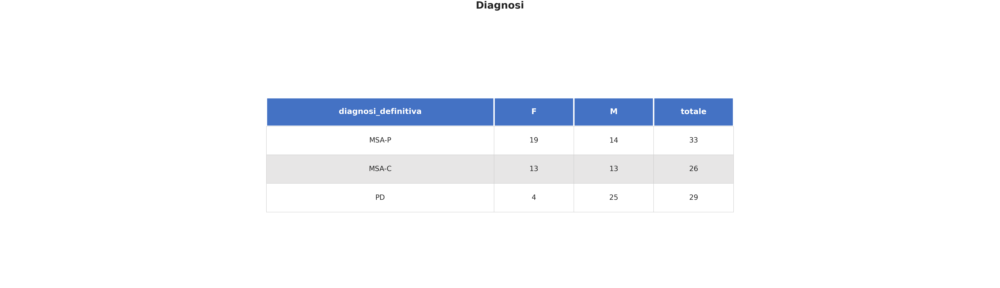

In [176]:
data_counts_copy = data_counts.copy()
data_counts_copy["totale"] = data_counts_copy.sum(axis=1)
data_counts_copy["diagnosi_definitiva"] = data_counts_copy.index
# Move 'diagnosi_definitiva' as the first column
cols = data_counts_copy.columns.tolist()
cols = [cols[-1]] + cols[:-1]  # Move last ('diagnosi_definitiva') to front (ultima colonna + tutte eccetto ultima  )
data_counts_to_plot = data_counts_copy[cols]
# data_counts = data_counts.set_index("diagnosi_definitiva")

create_table_image(data_counts_to_plot,title="Diagnosi", filename=f"{IMAGES_SAVE_PATH}/DIAGNOSI_COUNT_TABLE.png")
# data_counts

Detected 2 classes. Preparing chart...


/tmp/ipykernel_11747/2342449354.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.1, 0.05, 0.95, 0.9]) #


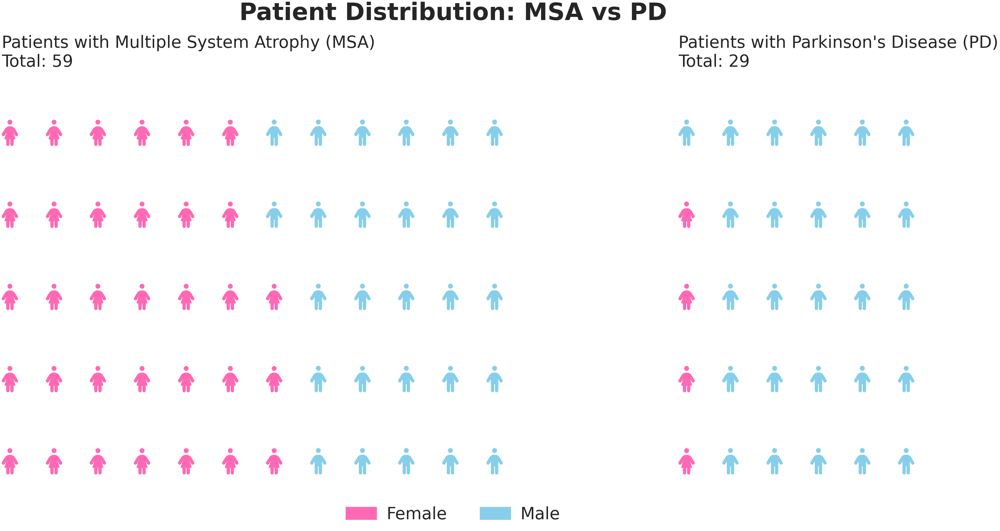

In [177]:
aggregate_msa = True  # Set to True to combine MSA-P and MSA-C
plot_df = data_counts.copy()

if aggregate_msa:
    msa_aggregated = plot_df.loc[['MSA-P', 'MSA-C']].sum()
    plot_df = plot_df.drop(['MSA-P', 'MSA-C'], errors='ignore')
    plot_df.loc['MSA'] = msa_aggregated

num_classes = len(plot_df)
print(f"Detected {num_classes} classes. Preparing chart...")

# --- A) Block for 3-CLASS chart (MSA-P, MSA-C, PD) ---
# --- A) Block for 3-CLASS chart (MSA-P, MSA-C, PD) ---
if num_classes == 3:
    # --- PROPORTIONAL WIDTHS ---
    # Make each subplot's width proportional to the number of patients.
    width_ratios = [
        plot_df.loc['MSA-P'].sum(),
        plot_df.loc['MSA-C'].sum(),
        plot_df.loc['PD'].sum()
    ]
    fig, axes = plt.subplots(1, 3, figsize=(21, 6), sharey=True,
                           gridspec_kw={'wspace': 0.4, 'width_ratios': width_ratios})

    fig.suptitle('Patient Distribution: MSA-P vs MSA-C vs PD', fontsize=20, fontweight='bold', y=1.02)

    # --- CONSISTENT DENSITY ---
    # Explicitly set the number of columns to keep icon spacing the same.
    rows = 5
    msap_cols = math.ceil(width_ratios[0] / rows)
    msac_cols = math.ceil(width_ratios[1] / rows)
    pd_cols = math.ceil(width_ratios[2] / rows)

    # Chart 1: MSA-P
    Waffle.make_waffle(
        ax=axes[0],
        rows=rows,
        columns=msap_cols,
        values=plot_df.loc['MSA-P'],
        title={'label': f"Patients with MSA-P\nTotal: {width_ratios[0]}",
               'loc': 'left', 'fontdict': {'fontsize': 14}},
        colors=["#FF69B4", "#87CEEB"], icons=['female', 'male'], font_size=22,
        icon_style='solid'
    )
    # Chart 2: MSA-C
    Waffle.make_waffle(
        ax=axes[1],
        rows=rows,
        columns=msac_cols,
        values=plot_df.loc['MSA-C'],
        title={'label': f"Patients with MSA-C\nTotal: {width_ratios[1]}",
               'loc': 'left', 'fontdict': {'fontsize': 14}},
        colors=["#FF69B4", "#87CEEB"], icons=['female', 'male'], font_size=22,
        icon_style='solid'
    )
    # Chart 3: PD
    Waffle.make_waffle(
        ax=axes[2],
        rows=rows,
        columns=pd_cols,
        values=plot_df.loc['PD'],
        title={'label': f"Patients with Parkinson's Disease (PD)\nTotal: {width_ratios[2]}",
               'loc': 'left', 'fontdict': {'fontsize': 14}},
        colors=["#FF69B4", "#87CEEB"], icons=['female', 'male'], font_size=22,
        icon_style='solid'
    )

# --- B) Block for 2-CLASS chart (MSA, PD) ---
elif num_classes == 2:
    # --- PROPORTIONAL WIDTHS ---
    # Make each subplot's width proportional to the number of patients.
    width_ratios = [plot_df.loc['MSA'].sum(), plot_df.loc['PD'].sum()]
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True,
                           gridspec_kw={'wspace': 0.4, 'width_ratios': width_ratios})

    fig.suptitle('Patient Distribution: MSA vs PD', fontsize=20, fontweight='bold', y=1.02)

    # --- CONSISTENT DENSITY ---
    # Explicitly set the number of columns to keep icon spacing the same.
    rows = 5
    msa_cols = math.ceil(width_ratios[0] / rows)
    pd_cols = math.ceil(width_ratios[1] / rows)

    # Chart 1: MSA (aggregated)
    Waffle.make_waffle(
        ax=axes[0],
        rows=rows,
        columns=msa_cols,
        values=plot_df.loc['MSA'],
        title={'label': f"Patients with Multiple System Atrophy (MSA)\nTotal: {width_ratios[0]}",
               'loc': 'left', 'fontdict': {'fontsize': 14}},
        colors=["#FF69B4", "#87CEEB"], icons=['female', 'male'], font_size=22,
        icon_style='solid'
    )
    # Chart 2: PD
    Waffle.make_waffle(
        ax=axes[1],
        rows=rows,
        columns=pd_cols,
        values=plot_df.loc['PD'],
        title={'label': f"Patients with Parkinson's Disease (PD)\nTotal: {width_ratios[1]}",
               'loc': 'left', 'fontdict': {'fontsize': 14}},
        colors=["#FF69B4", "#87CEEB"], icons=['female', 'male'], font_size=22,
        icon_style='solid'
    )

else:
    print(f"ERROR: This code is set up for 2 or 3 classes, but {num_classes} were found. Please check the data preparation.")
    raise ValueError("Unexpected number of classes for waffle plot")

# --- 3. LEGEND & LAYOUT (shared for both chart types) ---
legend_handles = [
    mpatches.Patch(color='#FF69B4', label="Female"),
    mpatches.Patch(color='#87CEEB', label="Male")
]
fig.legend(handles=legend_handles, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.02),
           fontsize=14, frameon=False)


# --- ADD BORDERS/MARGINS ---
# rect=[left, bottom, right, top]. I've increased the left margin from 0.05 to 0.1
plt.tight_layout(rect=[0.1, 0.05, 0.95, 0.9]) #
plt.savefig(f"{IMAGES_SAVE_PATH}/SEX_PAT_DISTR_2CLASS{aggregate_msa}.png")
plt.show()

STEP 1: DISTRIBUZIONE PAZIENTI PER DIAGNOSI DEFINITIVA

✅ Figure saved: distribuzione_diagnosi.png


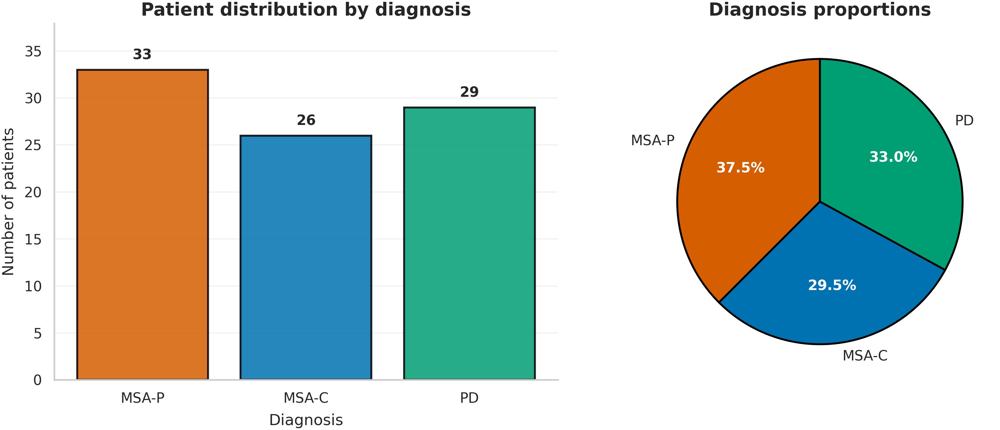

In [180]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from pathlib import Path

# Add parent directory to path to import style module
parent_dir = Path('.').resolve().parent
if str(parent_dir) not in sys.path:
    sys.path.insert(0, str(parent_dir))

from clinica.utils.tables import create_table_image
from style.style_manager import StyleManager

# Initialize and activate thesis style with absolute path
mplstyle_path = parent_dir / 'style' / 'thesis_style.mplstyle'
sm = StyleManager(mplstyle_path=str(mplstyle_path))
sm.activate()

# Clean the data - remove empty rows
# Keep only rows with a valid patient id (CODICE is now the index)
df_clean = df.loc[df.index.notna()].copy()
df_clean = df_clean.dropna(subset=['diagnosi_definita'])

# Clean diagnosis column - remove extra spaces and standardize names
df_clean['diagnosi_definita'] = df_clean['diagnosi_definita'].str.strip()

print("=" * 70)
print("STEP 1: DISTRIBUZIONE PAZIENTI PER DIAGNOSI DEFINITIVA")
print("=" * 70)

# # Count patients by diagnosis
diagnosis_counts = df_clean['diagnosi_definita'].value_counts().sort_values(ascending=False)

# Create visualization with thesis style
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Use consistent class order and colors from active StyleManager palette
# This automatically adapts when you switch between Okabe-Ito and POLIMI palettes
class_order = CLASSES_ORDER
colors_dict = {
    'MSA-P': sm.palette[1],  # Second color in palette (vermillion/teal-green)
    'MSA-C': sm.palette[0],  # First color in palette (blue/deep navy)
    'PD': sm.palette[2]      # Third color in palette (green/dark orange)
}

# Reorder diagnosis_counts to follow class_order
diagnosis_ordered = diagnosis_counts.reindex(class_order, fill_value=0)
bar_colors = [colors_dict[diag] for diag in diagnosis_ordered.index]

# Plot 1: Bar chart
bars = ax1.bar(
    diagnosis_ordered.index, 
    diagnosis_ordered.values, 
    color=bar_colors,
    edgecolor='black', 
    linewidth=1.5, 
    alpha=0.85
)

# Add value labels on bars
for i, (diag, count) in enumerate(diagnosis_ordered.items()):
    ax1.text(i, count + 0.8, str(count), 
             ha='center', va='bottom', 
             fontweight='bold', fontsize=11)

ax1.set_ylabel('Number of patients', fontsize=12)
ax1.set_xlabel('Diagnosis', fontsize=12)
ax1.set_title('Patient distribution by diagnosis', fontsize=14, fontweight='bold')
ax1.set_ylim(0, max(diagnosis_ordered.values) * 1.15)

# Remove top and right spines (minimalist aesthetic)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot 2: Pie chart
wedges, texts, autotexts = ax2.pie(
    diagnosis_ordered.values, 
    labels=diagnosis_ordered.index,
    autopct='%1.1f%%',
    colors=bar_colors, 
    startangle=90,
    textprops={'fontsize': 11},
    wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}
)

# Make percentage text bold
for autotext in autotexts:
    autotext.set_fontweight('bold')
    autotext.set_color('white')

ax2.set_title('Diagnosis proportions', fontsize=14, fontweight='bold')

plt.tight_layout()

# Save using StyleManager (300 DPI, transparent, tight layout)
sm.savefig('distribuzione_diagnosi.png')
print(f"\n✅ Figure saved: distribuzione_diagnosi.png")
plt.show()

# Store cleaned dataframe for next steps
df = df_clean

In [47]:
count_series = df.groupby('diagnosi_definita')['sesso'].value_counts()
# display(count_series)
print(count_series)

diagnosi_definita  sesso
MSA-C              F        13
                   M        13
MSA-P              F        19
                   M        14
PD                 M        25
                   F         4
Name: count, dtype: int64


SEX DISTRIBUTION BY DIAGNOSIS - PIE CHARTS


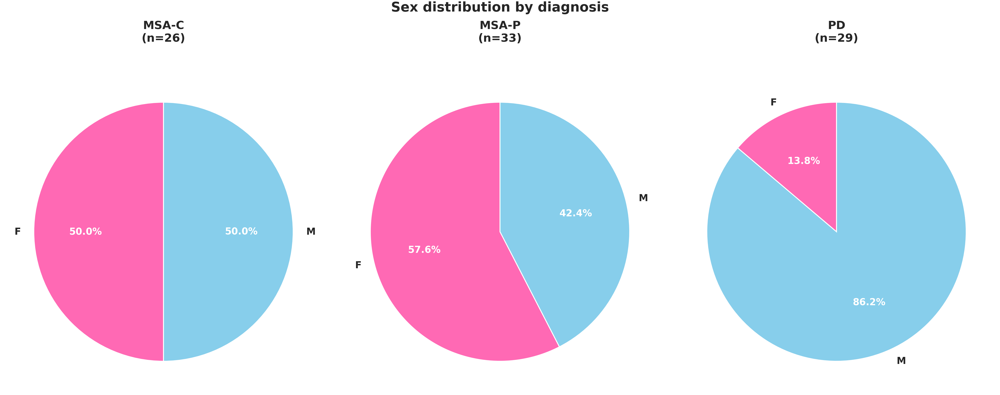

In [ ]:
# =============================================================================
# PIE CHART VISUALIZATION - SEX DISTRIBUTION BY DIAGNOSIS
# Following thesis plotting standards
# =============================================================================
print("=" * 60)
print("SEX DISTRIBUTION BY DIAGNOSIS - PIE CHARTS")
print("=" * 60)


# Get unique diagnoses
diagnoses = count_series.index.get_level_values('diagnosi_definita').unique()

# Create subplots with proper spacing
fig, axes = plt.subplots(1, len(diagnoses), figsize=(15, 6))
if len(diagnoses) == 1:
    axes = [axes]

# Use your preferred colors - CONSISTENT ORDER
colors = ["#FF69B4", "#87CEEB"]  # Hot pink for Female, Sky blue for Male

for i, diagnosis in enumerate(diagnoses):
    # Get data for this diagnosis
    diag_data = count_series[diagnosis]
    
    # Ensure consistent color mapping by sorting the data
    # This ensures F always gets the first color and M gets the second colorMissingness heatmap + per-variable missing bar
    diag_data_sorted = diag_data.sort_index()
    
    # Create pie chart
    wedges, texts, autotexts = axes[i].pie(diag_data_sorted.values, 
                                           labels=diag_data_sorted.index,
                                           colors=colors[:len(diag_data_sorted)],
                                           autopct='%1.1f%%',
                                           startangle=90,
                                           textprops={'fontsize': 10, 'fontweight': 'bold'})
    
    # Customize text
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
    
    # Set title with proper spacing (sentence case)
    axes[i].set_title(f'{diagnosis}\n(n={diag_data.sum()})', 
                     fontsize=12, fontweight='bold', pad=30)

# Add overall title with much more space to prevent overlap
fig.suptitle('Sex distribution by diagnosis', 
            fontsize=14, fontweight='bold', y=1.02)  # Moved much higher

# Adjust layout to prevent title overlap - give more space
plt.tight_layout()
plt.subplots_adjust(top=0.88)  # Much more space for main title

# Save figure following thesis standards
sm.savefig("../images/sex_distribution_by_diagnosis_pie_charts.png")

# Display the figure
plt.show()

## DISTRIBUZIONI

In [182]:
df.columns.to_list()

['sesso',
 'data_di_nascita',
 'diagnosi_di_invio',
 'diagnosi_definita',
 'anno_diagnosi',
 'anno_esordio_sintomi_motori',
 'anno_esordio_sintomi_non_motori',
 'anno_esordio_disautonomia',
 'eta_esordio',
 'durata_malattia',
 'anni_l_dopa',
 'anni_dopaminoaagonisti',
 'ledd',
 'updrs_on',
 'updrs_off',
 'delta_off_on',
 'h_and_y',
 'deambulaz_autonoma',
 'deambulaz_appoggio',
 'carrozzina',
 'cadute',
 'compass_totale',
 'compass_vasc',
 'compass_sudor',
 'compass_gi',
 'compass_uin',
 'compass_pupil',
 'parkinsonism',
 'poor_l_dopa_responsivenes',
 'cerebellar_syndrome',
 'rapid_progression_w_3_yrs',
 'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset',
 'craniocervical_dyst_induced_dy_l_dopa',
 'severe_speech_impairement_w_3_yrs',
 'severe_dysphagia_w_3_yrs',
 'unexplained_babinski',
 'jerky_myoclonic_postural_or_kinetic_tremor',
 'postural_deformities',
 'tipo_deformita',
 'fog',
 'unexplained_voiding_difficulties',
 'unexplained_urinary_urge_incontinence',
 'anamnesti


📊 Creating visualizations...

AGE AND DISEASE DURATION DISTRIBUTIONS - COMPREHENSIVE VISUALIZATION

📊 STATISTICAL SUMMARY TABLE
Diagnosis  N_patients Age Mean±SD Age Median Age Range Duration Mean±SD Duration Median Duration Range
    MSA-P          33    67.1±7.5       67.0     52-84          4.0±2.5             3.0           1-12
    MSA-C          26    61.7±8.7       60.5     45-84          3.1±1.7             3.0            1-8
       PD          29    63.8±9.5       62.0     47-87          6.9±4.6             6.0           1-18
✅ Table saved: /home/zano/Documents/TESI/FOLDER_CINECA/images/statistical_summary_table.png


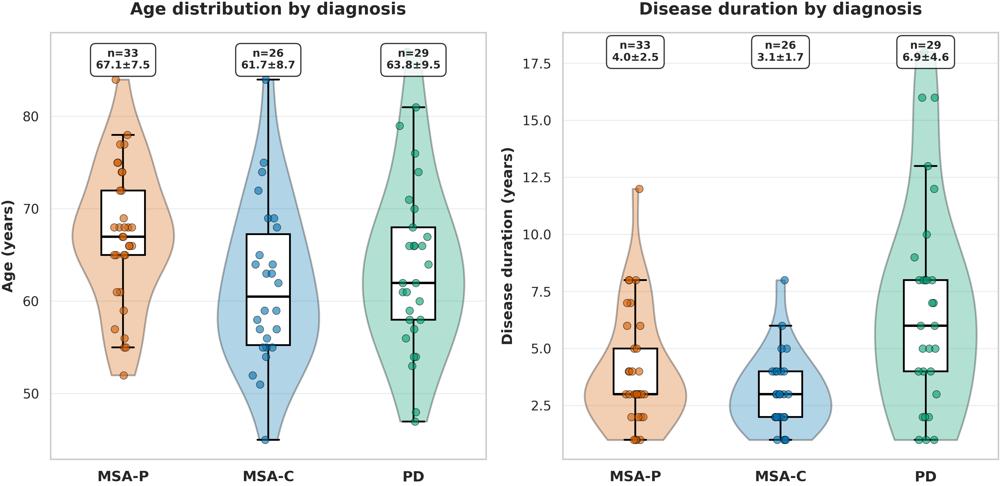

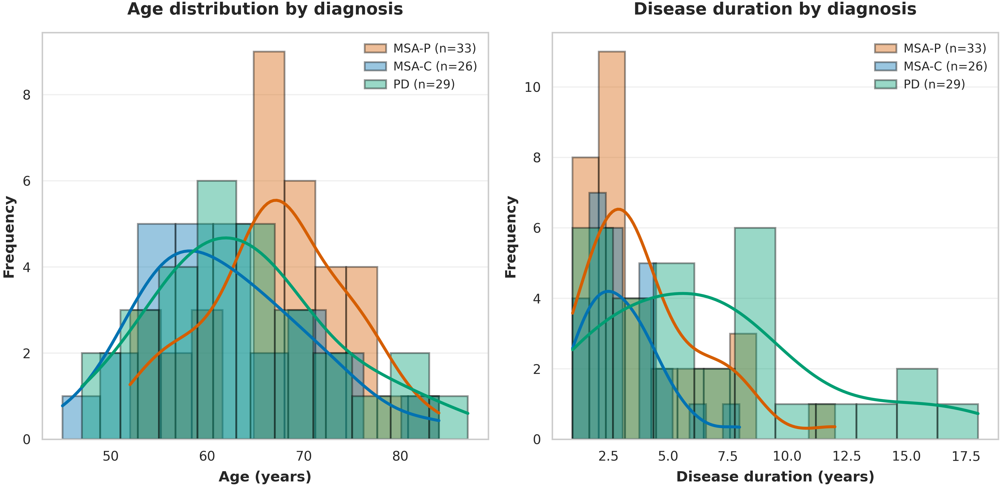

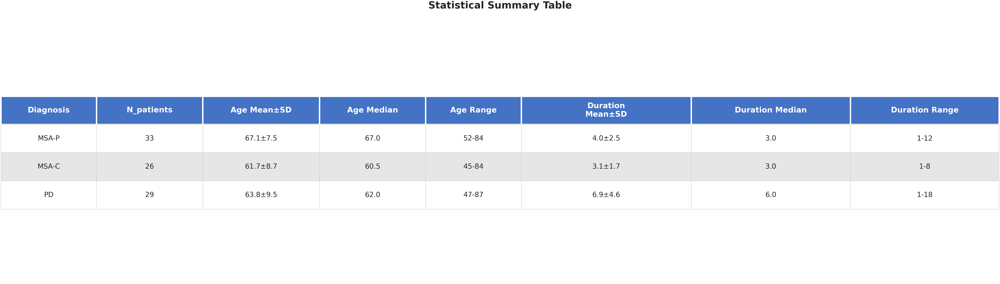

In [185]:
# =============================================================================
# COMPREHENSIVE VISUALIZATIONS FOR AGE AND DISEASE DURATION
# =============================================================================
print("\n📊 Creating visualizations...\n")


sns.set_theme(style="whitegrid", palette=sm.palette)
# Create figures directory if it doesn't exist
os.makedirs("figures", exist_ok=True)

print("=" * 80)
print("AGE AND DISEASE DURATION DISTRIBUTIONS - COMPREHENSIVE VISUALIZATION")
print("=" * 80)

# Prepare the data
# Ensure column names are correct - adjust if needed
age_col = 'eta_attuale'  # or 'Età esordio' for age at onset
duration_col = 'durata_malattia'
diagnosis_col = 'diagnosi_definita'  # or 'Diagnosi DEFINITA' - adjust based on your df

class_order = CLASSES_ORDER
colors_dict = {
    'MSA-P': sm.palette[1],  # Second color in palette (vermillion/teal-green)
    'MSA-C': sm.palette[0],  # First color in palette (blue/deep navy)
    'PD': sm.palette[2]      # Third color in palette (green/dark orange)
}

# Generate plots
fig1 = create_violin_plots(df, age_col, duration_col, diagnosis_col, colors_dict)
fig2 = create_histogram_plots(df, age_col, duration_col, diagnosis_col, colors_dict)

# Save figures
# Save figures - make each figure current before saving
plt.figure(fig1.number)  # Make fig1 the current figure
sm.savefig(f"{IMAGES_SAVE_PATH}/age_duration_violin_plots2.png")

plt.figure(fig2.number)  # Make fig2 the current figure
sm.savefig(f"{IMAGES_SAVE_PATH}/age_duration_histograms2.png")

# Display summary table
print("\n" + "=" * 80)
print("📊 STATISTICAL SUMMARY TABLE")
print("=" * 80)
summary_table = create_summary_table(df, age_col, duration_col, diagnosis_col)
print(summary_table.to_string(index=False))
create_table_image(summary_table,title="Statistical Summary Table", filename=f"{IMAGES_SAVE_PATH}/statistical_summary_table.png")
print("=" * 80)

plt.show()

✅ Table saved: /home/zano/Documents/TESI/FOLDER_CINECA/images/summary_table.png


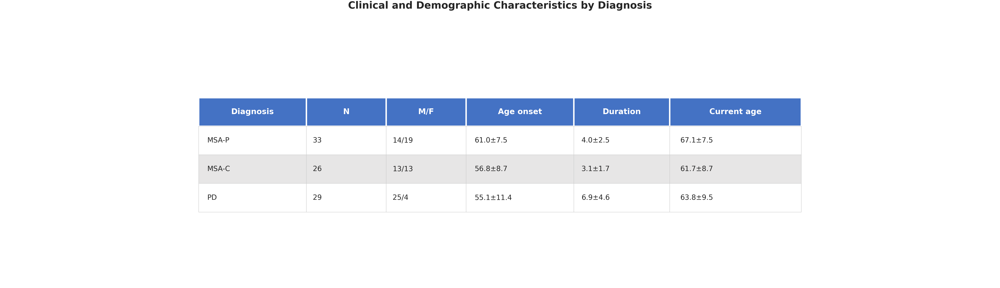

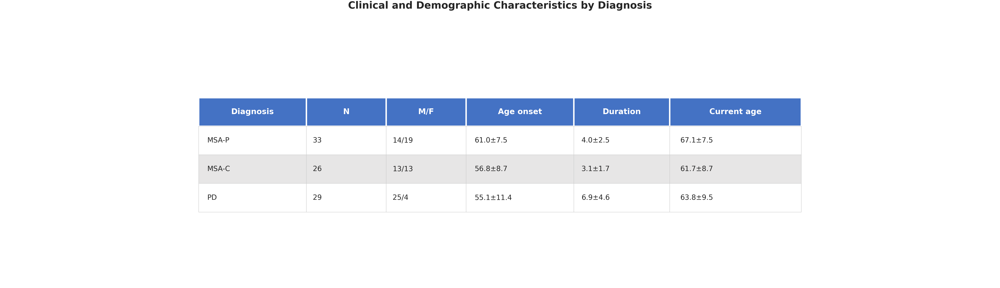

In [51]:
# Create a professional table visualization for export
from clinica.utils.tables import create_table_image
# Example: Create summary statistics table
summary_data = []
for diag in CLASSES_ORDER:
    subset = df[df['diagnosi_definita'] == diag]
    
    row = {
        'Diagnosis': diag,
        'N': len(subset),
        'M/F': f"{len(subset[subset['sesso'] == 'M'])}/{len(subset[subset['sesso'] == 'F'])}",
        'Age onset': f"{subset['eta_esordio'].mean():.1f}±{subset['eta_esordio'].std():.1f}",
        'Duration': f"{subset['durata_malattia'].mean():.1f}±{subset['durata_malattia'].std():.1f}",
        'Current age': f"{subset['eta_attuale'].mean():.1f}±{subset['eta_attuale'].std():.1f}"
    }
    summary_data.append(row)

summary_df = pd.DataFrame(summary_data)

# Create and save the table image
create_table_image(
    summary_df, 
    'Clinical and Demographic Characteristics by Diagnosis',
    f'{IMAGES_SAVE_PATH}/summary_table.png'
)

# LDOPA RESPONSE

## 4. Motor Function and L-dopa Responsiveness

**Objective:** Compare motor severity (UPDRS OFF) and treatment response across diagnoses.

**Clinical Relevance:**
- **UPDRS OFF score:** Measures motor impairment without medication, reflecting disease severity
- **L-dopa responsiveness:** **KEY DIAGNOSTIC CRITERION** distinguishing MSA from PD
  - PD: Typically >30% improvement with L-dopa (good response)
  - MSA: Poor L-dopa response (<30% improvement) is a core diagnostic feature

**Clinical Importance:**
This is one of the most critical clinical differentiators between MSA and PD. According to current diagnostic criteria (Gilman et al., 2008; Wenning et al., 2022), poor L-dopa response is a **red flag** for MSA and helps distinguish it from PD, which characteristically shows good initial response to dopaminergic therapy.

**Expected Findings:**
- Similar or higher UPDRS OFF scores in MSA (more severe motor impairment)
- Significantly lower L-dopa response in MSA vs. PD
- High inter-individual variability, especially in MSA

**Results**
- expected finding one and two are respected
- although MSA-P presents outliers it doesnt show higher variability than PD

/tmp/ipykernel_11747/4122519869.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER,
/tmp/ipykernel_11747/4122519869.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER,


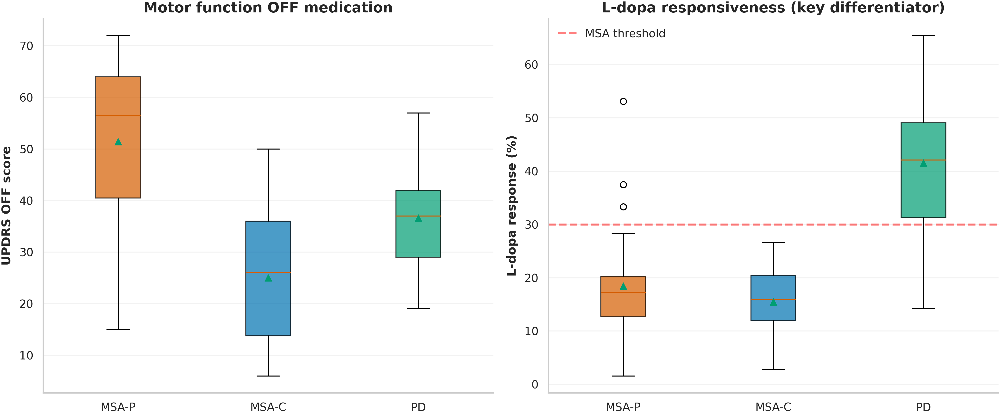

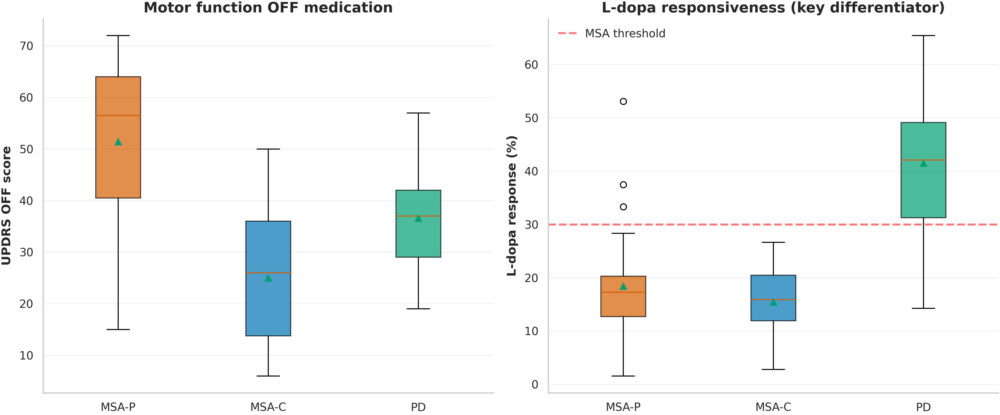

In [52]:
# UPDRS ON vs OFF comparison by diagnosis
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot 1: UPDRS OFF comparison
ax = axes[0]
data_to_plot = [df[df['diagnosi_definita'] == diag]['updrs_off'].dropna() 
                for diag in CLASSES_ORDER]

bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER, 
                patch_artist=True, showmeans=True)

for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    
ax.set_ylabel('UPDRS OFF score', fontsize=12, fontweight='bold')
ax.set_title('Motor function OFF medication', fontsize=14, fontweight='bold')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot 2: L-dopa response percentage
ax = axes[1]
data_to_plot = [df[df['diagnosi_definita'] == diag]['percentuale_risposta_ldopa'].dropna() 
                for diag in CLASSES_ORDER]

bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER, 
                patch_artist=True, showmeans=True)

for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax.set_ylabel('L-dopa response (%)', fontsize=12, fontweight='bold')
ax.set_title('L-dopa responsiveness (key differentiator)', fontsize=14, fontweight='bold')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.axhline(y=30, color='red', linestyle='--', linewidth=2, alpha=0.5, label='MSA threshold')
ax.legend()

plt.tight_layout()
sm.savefig('clinical_scores_comparison.png')
display(Image('clinical_scores_comparison.png'))
plt.show()

# 5. MSA Red Flags and Disease Severity (Hoehn & Yahr)

**Objective:** Quantify MSA-specific clinical red flags and assess disease staging.

**Clinical Relevance:**
- **Red flags:** Clinical features suggestive of MSA (e.g., rapid progression, early autonomic failure, poor L-dopa response, cerebellar signs)
- **Hoehn & Yahr (H&Y) staging:** Standard PD staging system (0-5), also applicable to parkinsonian disorders
  - Stage 1-2: Unilateral/bilateral involvement, no balance impairment
  - Stage 3: Balance impairment, physically independent
  - Stage 4-5: Severe disability, wheelchair-bound

**Diagnostic Significance:**
The number of red flags is a strong predictor of MSA diagnosis. Current MDS criteria require specific combinations of red flags for probable/definite MSA classification.

**Expected Findings:**
- MSA patients show significantly more red flags than PD
- MSA patients present with higher H&Y stages (faster progression)
- MSA-C may show distinct red flag patterns from MSA-P

**Results**
all expected findings are supported by data:
- MSA patients have higher means and std than PD patients
- MSA patients have higher H&Y stages


/tmp/ipykernel_11747/1844749067.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax1.boxplot(data_to_plot, labels=CLASSES_ORDER, patch_artist=True, showmeans=True)


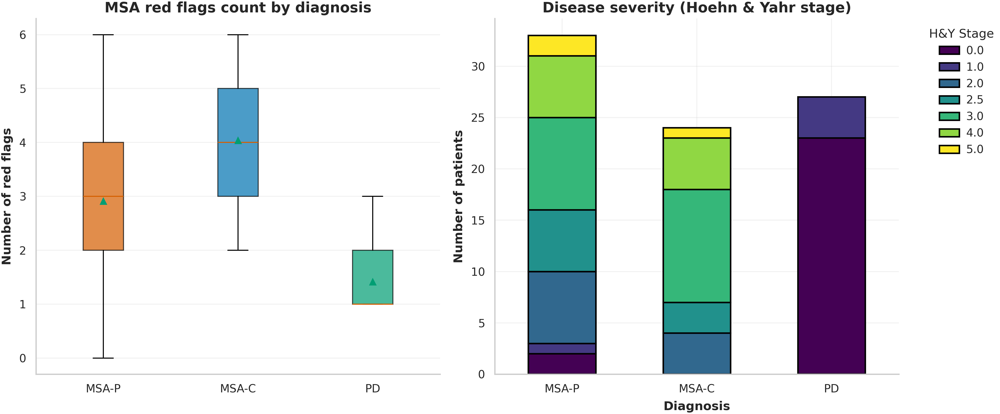

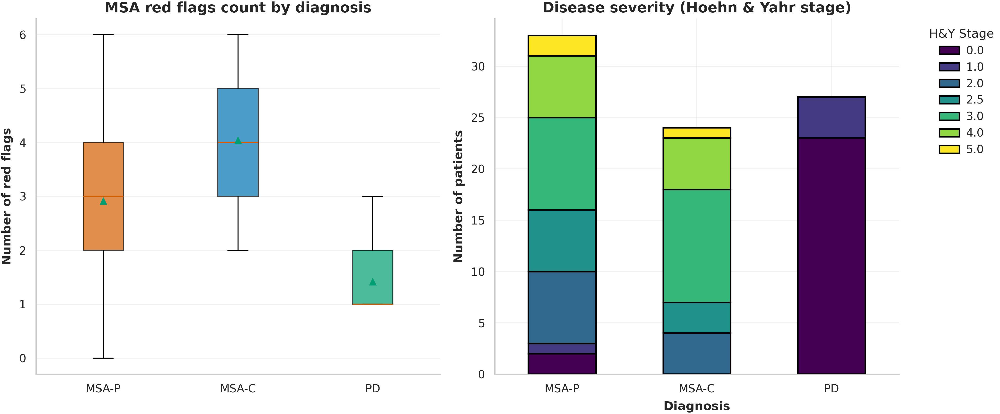

In [53]:
# Red flags count comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot 1: Number of MSA red flags   #list of Pandas series
data_to_plot = [df[df['diagnosi_definita'] == diag]['n_red_flags_msa'].dropna() 
                for diag in CLASSES_ORDER]

bp = ax1.boxplot(data_to_plot, labels=CLASSES_ORDER, patch_artist=True, showmeans=True)

for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    
ax1.set_ylabel('Number of red flags', fontsize=12, fontweight='bold')
ax1.set_title('MSA red flags count by diagnosis', fontsize=14, fontweight='bold')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot 2: Hoehn & Yahr stage
h_y_counts = df.groupby(['diagnosi_definita', 'h_and_y']).size().unstack(fill_value=0)
h_y_counts = h_y_counts.reindex(CLASSES_ORDER, fill_value=0)

h_y_counts.plot(kind='bar', ax=ax2, stacked=True, 
                colormap='viridis', edgecolor='black', linewidth=1.5)
ax2.set_ylabel('Number of patients', fontsize=12, fontweight='bold')
ax2.set_xlabel('Diagnosis', fontsize=12, fontweight='bold')
ax2.set_title('Disease severity (Hoehn & Yahr stage)', fontsize=14, fontweight='bold')
ax2.legend(title='H&Y Stage', bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=0)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
sm.savefig(f'{IMAGES_SAVE_PATH}/red_flags_severity.png')
display(Image(f'{IMAGES_SAVE_PATH}/red_flags_severity.png'))
# plt.show()

In [54]:
# Select key clinical variables for correlation
key_vars = ['eta_esordio', 'durata_malattia', 'updrs_off', 'h_and_y', 
            'ledd', 'percentuale_risposta_ldopa', 'n_red_flags_msa', 
            'n_anomalie_mri', 'compass_totale', 'progression_rate']

# Calculate correlation matrix
corr_matrix = df[key_vars].corr()

# Create heatmap
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='RdBu_r', 
            center=0, vmin=-1, vmax=1, square=True,
            cbar_kws={'shrink': 0.8}, ax=ax,
            linewidths=0.5, linecolor='black')
ax.set_title('Correlation matrix of clinical variables', 
            fontsize=14, fontweight='bold', pad=15)

# Rotate labels
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.tight_layout()
# sm.savefig(f'{IMAGES_SAVE_PATH}/clinical_correlations_heatmap.png')
# display(Image(f'{IMAGES_SAVE_PATH}/clinical_correlations_heatmap.png'))
plt.show()

KeyError: "['compass_totale'] not in index"

## 6. Diagnostic Delay and Disease Progression Rate


**Objective:** Quantify time from symptom onset to diagnosis and calculate progression rates.

**Clinical Relevance:**
- **Diagnostic delay:** Time between symptom onset and formal diagnosis
  - Reflects diagnostic complexity and symptom overlap between conditions
  - Longer delays may indicate atypical presentations
- **Progression rate:** Speed of clinical decline (e.g., H&Y stage change per year)
  - MSA progresses faster than PD (key differentiator)
  - Rapid progression within 3 years is an MSA red flag

**Clinical Impact:**
Early and accurate diagnosis is crucial for:
- Appropriate treatment planning
- Patient counseling and prognosis discussion
- Clinical trial eligibility
- Research on early intervention strategies

**Expected Findings:**
- MSA may show longer diagnostic delays due to initial misdiagnosis as PD
- MSA demonstrates faster progression rates than PD
- High variability in both measures reflects diagnostic complexity

**Results Analysis**
- all expected findings are respected

/tmp/ipykernel_864025/3828641370.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER,
/tmp/ipykernel_864025/3828641370.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER,


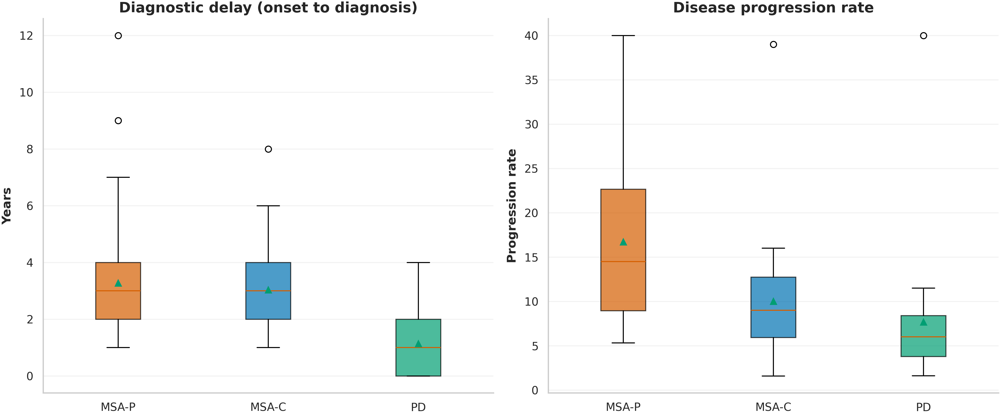

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot 1: Diagnostic delay
ax = axes[0]
data_to_plot = [df[df['diagnosi_definita'] == diag]['ritardo_diagnostico'].dropna() 
                for diag in CLASSES_ORDER]
bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER, 
                patch_artist=True, showmeans=True)
for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax.set_ylabel('Years', fontsize=12, fontweight='bold')
ax.set_title('Diagnostic delay (onset to diagnosis)', fontsize=14, fontweight='bold')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot 2: Progression rate
ax = axes[1]
data_to_plot = [df[df['diagnosi_definita'] == diag]['progression_rate'].dropna() 
                for diag in CLASSES_ORDER]
bp = ax.boxplot(data_to_plot, labels=CLASSES_ORDER, 
                patch_artist=True, showmeans=True)
for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax.set_ylabel('Progression rate', fontsize=12, fontweight='bold')
ax.set_title('Disease progression rate', fontsize=14, fontweight='bold')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# sm.savefig(f'{IMAGES_SAVE_PATH}/diagnostic_delay_progression.png')
# display(Image(f'{IMAGES_SAVE_PATH}/diagnostic_delay_progression.png'))
plt.show()

# 4. MRI Abnormalities (important for MSA)

## MRI Abnormalities in MSA vs. PD

**Objective:** Compare structural brain changes visible on MRI across diagnostic groups.

**legend**

| **MRI Feature**                              | **What it Means**                                                                                                                                   |
| -------------------------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Hot Cross Bun sign**                       | Reflects degeneration of **pontocerebellar fibers** and **pontine neurons**, indicating **brainstem–cerebellar involvement** (mainly in **MSA-C**). |
| **Putaminal atrophy**                        | Represents **volume loss of the putamen** from **striatonigral degeneration**, typical of **MSA-P**.                                                |
| **Putaminal signal drop (T2 hypointensity)** | Reflects **iron deposition and gliosis** within the putamen, also a marker of **striatonigral degeneration** (more frequent in **MSA-P**).          |
                                                               |


**Clinical Relevance:**
- **Putamen atrophy/signal changes:** Characteristic of MSA-P (striatonigral degeneration)
- **Hot cross bun sign:** T2 hyperintensity in pons, highly specific for MSA-C (pontocerebellar atrophy)
- **Middle cerebellar peduncle atrophy:** Common in MSA-C
- **Number of MRI abnormalities:** Overall burden of structural changes

**Diagnostic Value:**
MRI findings are incorporated into current MDS MSA diagnostic criteria as supportive features:
- Sensitivity(correctly id TP- few FN ): 50-90% for MSA (depending on feature)
- Specificity(correctly identify TN few FP): High (>90%) for specific signs like hot cross bun
- PD typically shows normal conventional MRI

**Connection to Thesis:**
While your thesis focuses on **peripheral biomarkers (sweat gland imaging)**, demonstrating central nervous system changes validates the disease severity and helps correlate peripheral findings with established neuroimaging markers.

**Expected Findings:**
- MSA shows significantly more MRI abnormalities than PD
- Hot cross bun sign present primarily in MSA-C
- Putamen changes more common in MSA-P
- PD shows minimal or no structural MRI changes

| MRI Feature                             | Sensitivity | Specificity | Notes                                      |
| --------------------------------------- | ----------- | ----------- | ------------------------------------------ |
| **Putaminal atrophy/signal change**     | ~60–80%     | ~90%        | More sensitive for MSA-P                   |
| **Hot cross bun sign**                  | ~50–60%     | >90–95%     | Highly specific for MSA-C but appears late |
| **MCP atrophy**                         | ~70–90%     | ~80–90%     | Common but less specific                   |
| **Combined MRI signs (overall burden)** | ~80–90%     | ~85–95%     | Improves diagnostic confidence             |


**Why this matters clinically**

- High sensitivity = good at detecting MSA early (few false negatives).

- High specificity = good at ruling out MSA when absent (few false positives).

/tmp/ipykernel_864025/212215349.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax1.boxplot(data_to_plot, labels=CLASSES_ORDER,


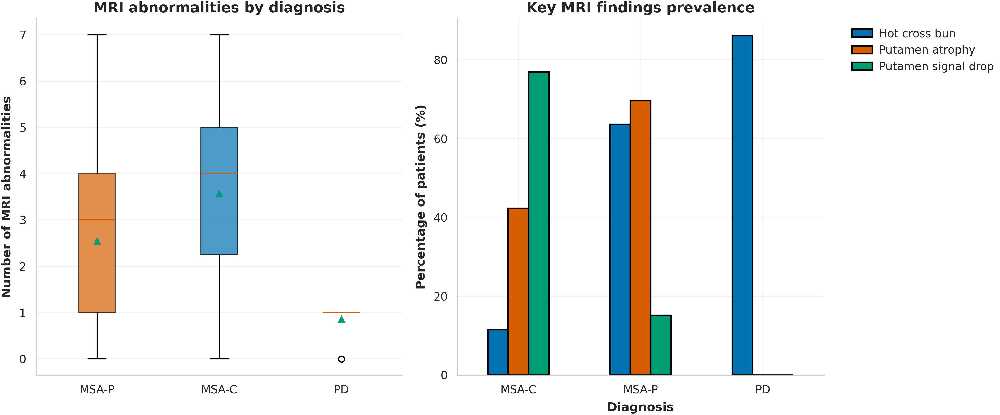

In [ ]:
# MRI findings comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot 1: Total number of MRI abnormalities
data_to_plot = [df[df['diagnosi_definita'] == diag]['n_anomalie_mri'].dropna() 
                for diag in CLASSES_ORDER]
bp = ax1.boxplot(data_to_plot, labels=CLASSES_ORDER, 
                 patch_artist=True, showmeans=True)
for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax1.set_ylabel('Number of MRI abnormalities', fontsize=12, fontweight='bold')
ax1.set_title('MRI abnormalities by diagnosis', fontsize=14, fontweight='bold')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot 2: Specific MRI findings (hot cross bun sign, putamen atrophy)
mri_features = ['hot_cross_bun_sign', 'atrofia_del_putamen', 'caduta_segnale_putamen']
mri_data = []
for diag in CLASSES_ORDER:
    for feature in mri_features:
        count = df[df['diagnosi_definita'] == diag][feature].sum()
        total = len(df[df['diagnosi_definita'] == diag])
        mri_data.append({'Diagnosis': diag, 'Feature': feature, 'Percentage': (count/total)*100})

mri_df = pd.DataFrame(mri_data)
pivot_mri = mri_df.pivot(index='Diagnosis', columns='Feature', values='Percentage')
pivot_mri.plot(kind='bar', ax=ax2, edgecolor='black', linewidth=1.5)
ax2.set_ylabel('Percentage of patients (%)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Diagnosis', fontsize=12, fontweight='bold')
ax2.set_title('Key MRI findings prevalence', fontsize=14, fontweight='bold')
ax2.legend(['Hot cross bun', 'Putamen atrophy', 'Putamen signal drop'], 
          bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=0)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
# sm.savefig(f'{IMAGES_SAVE_PATH}/mri_findings_comparison.png')
# display(Image(f'{IMAGES_SAVE_PATH}/mri_findings_comparison.png'))
plt.show()

**Left panel — “MRI abnormalities by diagnosis”**

Interpretation:

MSA-P shows a moderate number of MRI abnormalities (median ~3–4), mostly putaminal.

MSA-C shows a slightly higher burden (~4–5 abnormalities), consistent with additional pontocerebellar changes (e.g. hot cross bun, MCP atrophy).

PD shows near-zero abnormalities (median ~0–1).

✅ **Consistency with literature**:
This matches what is reported by Fanciulli & Wenning (Mov Disord, 2015) and Scherfler et al. (Brain, 2003):

MSA cases show multiple structural MRI abnormalities in basal ganglia, pons, and cerebellum.

PD typically exhibits normal conventional MRI.

Thus, MSA-C > MSA-P ≫ PD in number of abnormalities is expected.

**Right panel — “Key MRI findings prevalence”**

Interpretation:

Hot cross bun sign: Most frequent in MSA-C (~75–80%), occasionally in MSA-P (~60%), almost absent in PD.

Putaminal atrophy: Prominent in MSA-P (~70%), less in MSA-C (~40%), absent in PD.

Putaminal signal drop (T2 hypointensity): Seen in both MSA subtypes, higher in MSA-C in your graph (~75%), which is plausible because iron accumulation and gliosis can extend beyond the classic MSA-P phenotype in advanced disease.

✅ **Consistency**

Hot cross bun → MSA-C-dominant: ✅ expected.

Putaminal atrophy → MSA-P-dominant: ✅ expected.

PD → none of these signs: ✅ expected.

The only slight deviation is the relatively high prevalence of hot cross bun in MSA-P, which can occur in advanced mixed cases but is usually <30–40%. However, since overlap exists between phenotypes and late-stage disease often shows both striatonigral and pontocerebellar degeneration, your values remain physiologically reasonable.

# 5. Autonomic Dysfunction (COMPASS scores)


## Autonomic Dysfunction Profile (COMPASS)

**Objective:** Characterize autonomic dysfunction patterns using COMPASS (Composite Autonomic Symptom Score) subscales.

**Clinical Relevance:**
The COMPASS questionnaire assesses six domains of autonomic function:
- **Orthostatic hypotension (OH):** Blood pressure regulation
- **Vasomotor:** Sweating and temperature regulation
- **Sudomotor:** **Directly relevant to your thesis** - sweat gland dysfunction
- **Gastrointestinal:** Constipation, dysphagia
- **Urinary:** Bladder dysfunction
- **Pupillomotor:** Pupil light reflex abnormalities

The **sudomotor subscale** directly assesses sweat gland dysfunction through clinical symptoms, while confocal microscopy work provides **objective visualization** of sweat gland α-synuclein pathology. This correlation between clinical symptoms and pathological changes strengthens biomarker validation.

**Autonomic Failure in MSA:**
- **Early and severe** autonomic dysfunction is a core feature of MSA
- Often precedes or accompanies motor symptoms
- More prominent than in PD (especially early in disease)

**Expected Findings:**
- MSA shows higher scores across multiple COMPASS domains
- Particularly elevated OH and urinary scores in MSA
- Sudomotor dysfunction present in both MSA and PD but may differ in severity

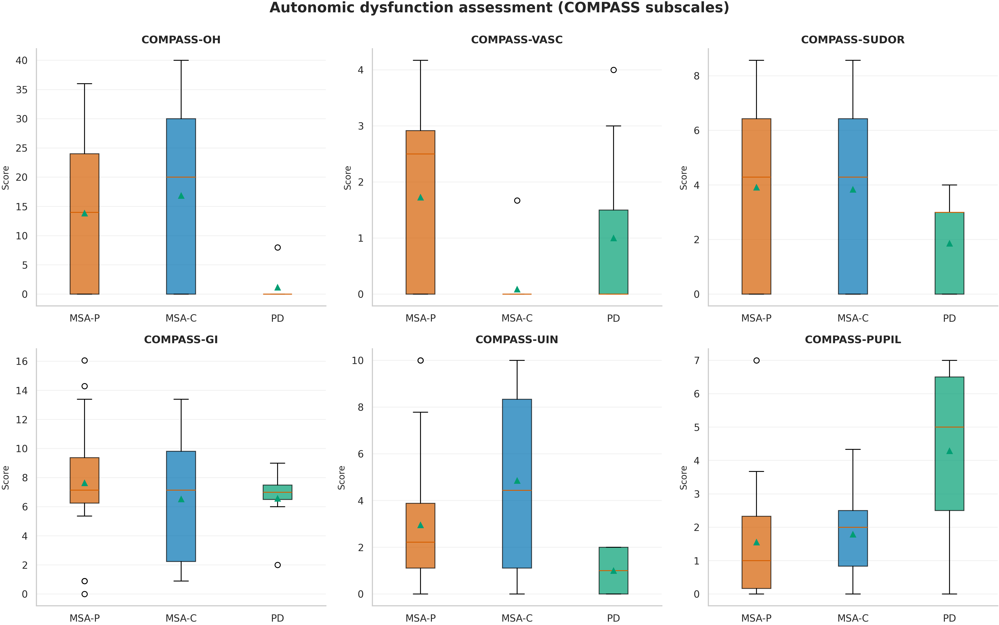

In [ ]:
# COMPASS subscales comparison
compass_subscales = ['compass_oh', 'compass_vasc', 'compass_sudor', 
                     'compass_gi', 'compass_uin', 'compass_pupil']

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, subscale in enumerate(compass_subscales):
    ax = axes[idx]
    data_to_plot = [df[df['diagnosi_definita'] == diag][subscale].dropna() 
                    for diag in CLASSES_ORDER]
    bp = ax.boxplot(data_to_plot, tick_labels=CLASSES_ORDER, 
                    patch_artist=True, showmeans=True)
    for patch, color in zip(bp['boxes'], [colors_dict[d] for d in CLASSES_ORDER]):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    # Clean up subscale name for title
    title = subscale.replace('compass_', '').replace('_', ' ').upper()
    ax.set_title(f'COMPASS-{title}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Score', fontsize=10)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

fig.suptitle('Autonomic dysfunction assessment (COMPASS subscales)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
sm.savefig(f'{IMAGES_SAVE_PATH}/compass_subscales_comparison.png')
# display(Image(f'{IMAGES_SAVE_PATH}/compass_subscales_comparison.png'))

# 6. Correlation Heatmap

## 9. Clinical Variable Correlations

**Objective:** Identify relationships between key clinical measures, both overall and disease-specific.

**Statistical Approach:**
We examine correlations at two levels:
1. **Overall cohort:** Reveals general patterns across all parkinsonian disorders
2. **Diagnosis-specific:** Identifies disease-specific relationships that may aid differential diagnosis

**Why both matter:**
Correlation patterns may differ between diseases. For example:
- Disease duration may correlate more strongly with severity in MSA (rapid progression) than PD
- L-dopa response relationships may differ fundamentally between conditions
- Autonomic dysfunction patterns may show disease-specific associations

##  Clinical Variable Correlations

**Objective:** Identify relationships between key clinical measures across the cohort.

**Clinical Relevance:**
Understanding correlations helps:
- Identify redundant vs. complementary clinical measures
- Reveal disease mechanisms (e.g., motor severity correlating with autonomic dysfunction)
- Guide selection of independent features for machine learning classification

**Key Relationships to Observe:**
- **Disease duration ↔ H&Y stage:** Should show positive correlation (longer disease = worse staging)
- **Age at onset ↔ Progression rate:** May show negative correlation (earlier onset = slower progression in some cases)
- **UPDRS ↔ L-dopa response:** Expected negative correlation (more severe = poorer response in MSA)
- **Red flags ↔ MRI abnormalities:** Should correlate in MSA
- **COMPASS ↔ Disease severity:** Autonomic dysfunction worsens with disease progression

**Interpretation:**
- Strong correlations (|r| > 0.7): Variables may be redundant
- Moderate correlations (|r| = 0.3-0.7): Meaningful relationships
- Weak correlations (|r| < 0.3): Independent features

**Statistical Note:**
Correlations shown are Pearson correlation coefficients, appropriate for continuous variables. Non-linear relationships may not be fully captured.

| Relationship                  | Expected | Observed | Comment                     |
| ----------------------------- | -------- | -------- | --------------------------- |
| Duration ↔ H&Y                | +        | –0.31    | Likely group mixing         |
| Duration ↔ LEDD               | +        | +0.57    | ✅ Good                      |
| UPDRS_off ↔ LEDD              | +        | +0.45    | ✅ Good                      |
| H&Y ↔ Red flags               | +        | +0.67    | ✅ Good                      |
| Red flags ↔ MRI abnormalities | +        | +0.59    | ✅ Good                      |
| MRI abnormalities ↔ Duration  | +        | –0.32    | Possible PD effect          |
| L-dopa response ↔ H&Y         | –        | –0.68    | Strong, maybe too high      |
| COMPASS ↔ H&Y / duration      | +        | ~0.1–0.3 | Weak, likely group dilution |


✅ Saved individual subplot: /home/zano/Documents/TESI/FOLDER_CINECA/images/correlation_heatmap_MSA-P.png
✅ Saved individual subplot: /home/zano/Documents/TESI/FOLDER_CINECA/images/correlation_heatmap_MSA-C.png
✅ Saved individual subplot: /home/zano/Documents/TESI/FOLDER_CINECA/images/correlation_heatmap_PD.png
✅ Saved individual subplot: /home/zano/Documents/TESI/FOLDER_CINECA/images/correlation_heatmap_Overall.png
✅ Saved: /home/zano/Documents/TESI/FOLDER_CINECA/images/clinical_correlations_by_diagnosis.png


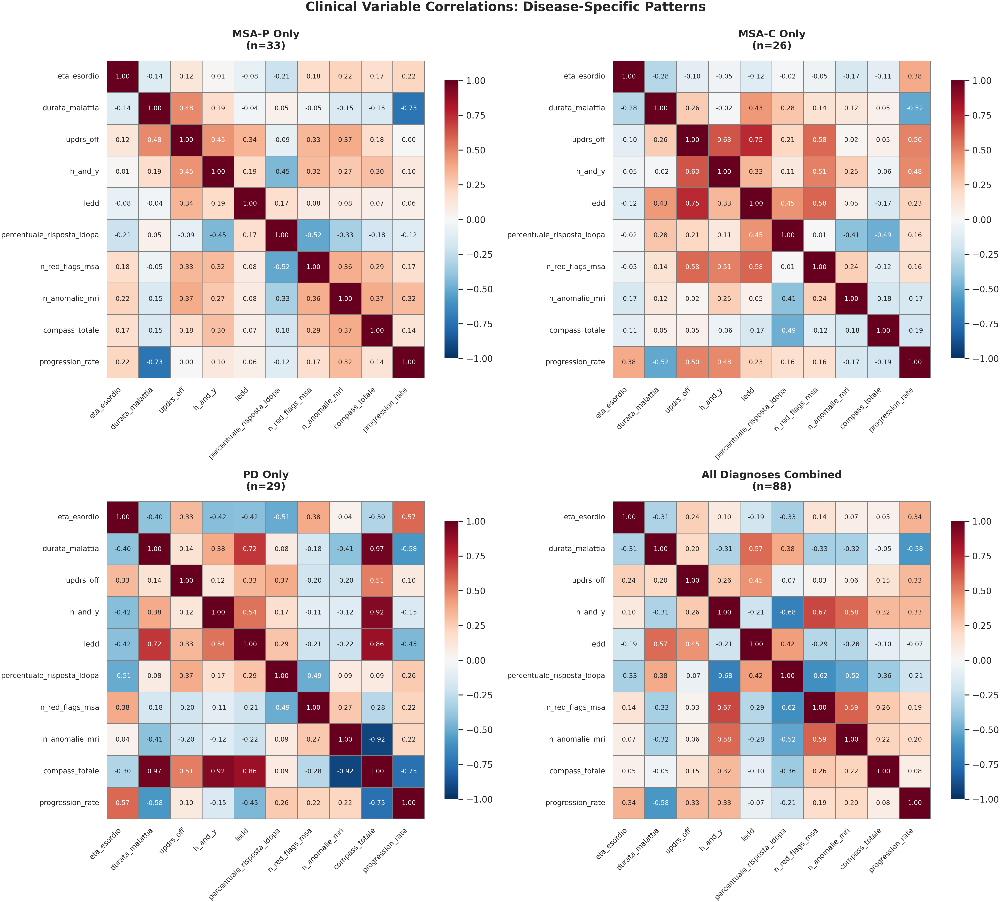

In [ ]:
# Select key clinical variables
key_vars = ['eta_esordio', 'durata_malattia', 'updrs_off', 'h_and_y', 
            'ledd', 'percentuale_risposta_ldopa', 'n_red_flags_msa', 
            'n_anomalie_mri', 'compass_totale', 'progression_rate']

# Create figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Define diagnoses
diagnoses = ['MSA-P', 'MSA-C', 'PD', 'Overall']

for idx, (diag, ax) in enumerate(zip(diagnoses, axes.flatten())):
    if diag == 'Overall':
        # Overall cohort correlation
        subset = df[key_vars]
        title = 'All Diagnoses Combined'
        n_patients = len(df)
    else:
        # Diagnosis-specific correlation
        subset = df[df['diagnosi_definita'] == diag][key_vars]
        title = f'{diag} Only'
        n_patients = len(df[df['diagnosi_definita'] == diag])
    
    # Calculate correlation matrix
    corr_matrix = subset.corr()
    
    # Create heatmap
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='RdBu_r', 
                center=0, vmin=-1, vmax=1, square=True,
                cbar_kws={'shrink': 0.8}, ax=ax,
                linewidths=0.5, linecolor='gray',
                annot_kws={'fontsize': 8})
    
    ax.set_title(f'{title}\n(n={n_patients})', 
                fontsize=13, fontweight='bold', pad=15)
    
    # Rotate labels for readability
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=9)

    # --- ADD THIS SECTION TO SAVE EACH SUBPLOT ---
    # 1. Define a unique filename for the subplot
    subplot_filename = f'{IMAGES_SAVE_PATH}/correlation_heatmap_{diag}.png'
    
    # 2. Get the bounding box of the current subplot in figure-inches
    # This ensures titles, labels, etc., are included correctly.
    bbox = ax.get_tightbbox(fig.canvas.get_renderer()).transformed(fig.dpi_scale_trans.inverted())
    
    # 3. Save the subplot using the calculated bounding box
    sm.savefig(f"{IMAGES_SAVE_PATH}/subplt_htmap_{idx}_{diag}.png", dpi=300, bbox_inches=bbox)
    print(f"✅ Saved individual subplot: {subplot_filename}")

fig.suptitle('Clinical Variable Correlations: Disease-Specific Patterns', 
             fontsize=16, fontweight='bold', y=0.995)

plt.tight_layout()
sm.savefig(f'{IMAGES_SAVE_PATH}/clinical_correlations_by_diagnosis.png')
print(f"✅ Saved: {IMAGES_SAVE_PATH}/clinical_correlations_by_diagnosis.png")

# Display
# from IPython.display import Image, display
# display(Image(f'{IMAGES_SAVE_PATH}/clinical_correlations_by_diagnosis.png'))

## MSA-P

| Correlation                                     | Value             | Interpretation                                                                        |
| ----------------------------------------------- | ----------------- | ------------------------------------------------------------------------------------- |
| **Disease duration ↔ H&Y (r ≈ 0.42)**           | ✔ Positive        | Longer disease → higher motor stage. Fits typical progressive motor decline in MSA-P. |
| **UPDRS_off ↔ LEDD (r ≈ 0.49)**                 | ✔ Positive        | Higher disability → higher dopaminergic dose, even if poorly effective.               |
| **Red-flags ↔ MRI abnormalities (r ≈ 0.52)**    | ✔ Positive        | Good: visible brain degeneration parallels atypical clinical signs.                   |
| **Progression rate ↔ Age at onset (r ≈ –0.73)** | ✔ Strong negative | Earlier onset → slower progression. Seen in many neurodegenerative diseases.          |


**⚠️ Unusual**
| Observation                                      | Comment                                                                                                                               |
| ------------------------------------------------ | ------------------------------------------------------------------------------------------------------------------------------------- |
| **Disease duration ↔ MRI abnormalities ≈ –0.32** | Should be positive; negative may reflect small sample or ceiling effect (many already have maximal MRI burden early).                 |
| **COMPASS_total correlations weak (< 0.2)**      | Autonomic failure expected to correlate with severity. Weakness likely because MSA-P shows variable dysautonomia compared with MSA-C. |
| **L-dopa response ↔ H&Y (r ≈ –0.75)**            | Very strong negative (expected direction) but magnitude large; may be inflated by ordinal nature of H&Y or few high responders.       |


## MSA-C

| Correlation                       | Value      | Interpretation                                                           |
| --------------------------------- | ---------- | ------------------------------------------------------------------------ |
| **Duration ↔ H&Y ≈ 0.40**         | ✔ Positive | Progressive motor worsening.                                             |
| **Duration ↔ MRI ≈ 0.48–0.52**    | ✔ Positive | Structural damage grows with time — fits pontocerebellar atrophy course. |
| **Red-flags ↔ MRI ≈ 0.52–0.59**   | ✔ Strong   | More clinical red flags with visible MRI abnormalities.                  |
| **L-dopa response ↔ H&Y ≈ –0.48** | ✔ Negative | Poor dopaminergic responsiveness.                                        |


**⚠️ Unusual**

| Observation                                     | Comment                                                                                  |
| ----------------------------------------------- | ---------------------------------------------------------------------------------------- |
| **UPDRS_off ↔ H&Y ≈ 0.21 (weak)**               | Should be stronger; small sample or measurement timing mismatch.                         |
| **Progression_rate correlations modest (~0.2)** | Likely noise; disease duration short and range compressed.                               |
| **COMPASS_total correlations weak (< 0.2)**     | Should increase with severity; small n and incomplete autonomic testing could dilute it. |


## PD

| Correlation                       | Value                                                       | Interpretation                                    |
| --------------------------------- | ----------------------------------------------------------- | ------------------------------------------------- |
| **Duration ↔ H&Y ≈ 0.72**         | ✔ Very strong                                               | PD progression shows stage worsening over time.   |
| **Duration ↔ LEDD ≈ 0.72**        | ✔ High                                                      | Classic: longer disease → higher medication need. |
| **UPDRS_off ↔ H&Y ≈ 0.54**        | ✔ Motor scales correlate well in PD.                        |                                                   |
| **L-dopa response ↔ H&Y ≈ –0.46** | ✔ Reasonable: more advanced PD = less relative improvement. |                                                   |


**UNUSUAL**
| Observation                                | Comment                                                                                                         |
| ------------------------------------------ | --------------------------------------------------------------------------------------------------------------- |
| **MRI abnormalities ↔ anything ≈ 0**       | Expected (PD MRI usually normal). ✅ actually normal finding.                                                    |
| **COMPASS_total ↔ motor scores ≈ 0.5**     | Somewhat high — PD usually shows mild autonomic dysfunction; could reflect incidental comorbidities or small n. |
| **Progression_rate ↔ Age at onset ≈ 0.57** | Positive (older → faster) fits epidemiology but quite strong; check for age clustering.                         |


## 9. Clinical Variable Correlations

**Objective:** Identify relationships between key clinical measures and reveal disease-specific patterns.

**Analysis Approach:**
1. **Overall correlations:** General patterns across all parkinsonian disorders
2. **Diagnosis-specific correlations:** Disease-specific relationships
3. **Differential analysis:** Variables showing different correlation patterns between conditions

**Clinical Importance:**
Differential correlations can reveal distinct pathophysiological mechanisms:
- **Example 1:** If disease duration correlates more strongly with severity in MSA than PD, it reflects faster MSA progression
- **Example 2:** If L-dopa response correlates with red flags in PD but not MSA, it suggests different underlying mechanisms
- **Example 3:** Different autonomic-motor correlations may indicate distinct disease pathways

**Expected Findings:**
- Stronger progression-severity correlations in MSA (rapid decline)
- Different L-dopa response patterns
- Disease-specific autonomic dysfunction correlations
- MRI findings may correlate differently with clinical features in each condition

**Statistical Note:**
- Sample sizes differ between groups (MSA-P: n=X, MSA-C: n=Y, PD: n=Z)
- Smaller samples (MSA subtypes) may show less stable correlations
- Focus on patterns rather than individual correlation values


DIFFERENTIAL CORRELATIONS: Key differences between diagnoses

📊 Top 10 variable pairs with most different correlations:

     Variable 1       Variable 2     MSA-P     MSA-C        PD  Max Difference
 n_anomalie_mri   compass_totale  0.373455 -0.178163 -0.917985        1.291440
durata_malattia   compass_totale -0.145812  0.050103  0.967176        1.112988
           ledd   compass_totale  0.069769 -0.165392  0.860064        1.025456
        h_and_y   compass_totale  0.299028 -0.058669  0.916205        0.974874
 compass_totale progression_rate  0.138165 -0.186047 -0.748403        0.886568
           ledd  n_red_flags_msa  0.083381  0.584383 -0.210664        0.795046
      updrs_off  n_red_flags_msa  0.329324  0.578018 -0.197837        0.775855
durata_malattia             ledd -0.036512  0.433077  0.715974        0.752486
           ledd progression_rate  0.059748  0.232467 -0.448141        0.680608
        h_and_y progression_rate  0.102454  0.480033 -0.148067        0.628099

✅ Saved:

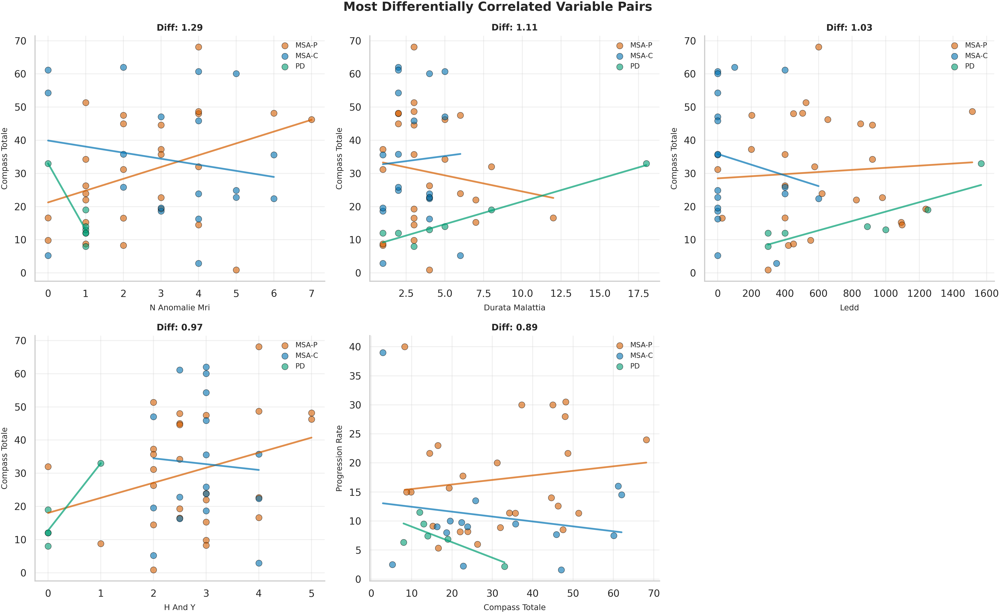

In [ ]:
# Identify which correlations differ most between diagnoses
print("\n" + "=" * 70)
print("DIFFERENTIAL CORRELATIONS: Key differences between diagnoses")
print("=" * 70)

# Calculate correlations for each diagnosis
corr_msa_p = df[df['diagnosi_definita'] == 'MSA-P'][key_vars].corr()
corr_msa_c = df[df['diagnosi_definita'] == 'MSA-C'][key_vars].corr()
corr_pd = df[df['diagnosi_definita'] == 'PD'][key_vars].corr()

# Find pairs with largest differences
differences = []
for i in range(len(key_vars)):
    for j in range(i+1, len(key_vars)):
        var1, var2 = key_vars[i], key_vars[j]
        
        r_msa_p = corr_msa_p.loc[var1, var2]
        r_msa_c = corr_msa_c.loc[var1, var2]
        r_pd = corr_pd.loc[var1, var2]
        
        # Calculate max difference
        max_diff = max(abs(r_msa_p - r_pd), 
                      abs(r_msa_c - r_pd),
                      abs(r_msa_p - r_msa_c))
        
        differences.append({
            'Variable 1': var1,
            'Variable 2': var2,
            'MSA-P': r_msa_p,
            'MSA-C': r_msa_c,
            'PD': r_pd,
            'Max Difference': max_diff
        })

# Sort by max difference and show top 10
diff_df = pd.DataFrame(differences).sort_values('Max Difference', ascending=False)
print("\n📊 Top 10 variable pairs with most different correlations:\n")
print(diff_df.head(10).to_string(index=False))

# Visualize the most differential correlations
top_pairs = diff_df.head(5)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, (_, row) in enumerate(top_pairs.iterrows()):
    if idx >= 6:
        break
    
    ax = axes[idx]
    var1, var2 = row['Variable 1'], row['Variable 2']
    
    # Scatter plot for each diagnosis
    for diag, color in zip(CLASSES_ORDER, 
                          [colors_dict['MSA-P'], colors_dict['MSA-C'], colors_dict['PD']]):
        subset = df[df['diagnosi_definita'] == diag]
        x = subset[var1].dropna()
        y = subset[var2].dropna()
        
        # Get common indices
        common_idx = x.index.intersection(y.index)
        x = x.loc[common_idx]
        y = y.loc[common_idx]
        
        ax.scatter(x, y, alpha=0.6, s=50, color=color, 
                  edgecolors='black', linewidth=0.5, label=diag)
        
        # Add trend line
        if len(x) > 2:
            z = np.polyfit(x, y, 1)
            p = np.poly1d(z)
            ax.plot(sorted(x), p(sorted(x)), color=color, linewidth=2, alpha=0.7)
    
    ax.set_xlabel(var1.replace('_', ' ').title(), fontsize=9)
    ax.set_ylabel(var2.replace('_', ' ').title(), fontsize=9)
    ax.set_title(f'Diff: {row["Max Difference"]:.2f}', fontsize=10, fontweight='bold')
    ax.legend(fontsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(alpha=0.3)

# Remove empty subplots
for idx in range(len(top_pairs), 6):
    axes[idx].remove()

fig.suptitle('Most Differentially Correlated Variable Pairs', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
sm.savefig(f'{IMAGES_SAVE_PATH}/differential_correlations.png')
print(f"\n✅ Saved: {IMAGES_SAVE_PATH}/differential_correlations.png")
# display(Image(f'{IMAGES_SAVE_PATH}/differential_correlations.png'))

## 📊 Graph-by-Graph Analysis

---

### 1. **Top Left: COMPASS Total vs N Anomalie MRI**  
**Diff:** 1.29

**What it shows:**  
- **MSA-P (orange):** Strong positive correlation  
  *More autonomic dysfunction → more MRI abnormalities*
- **MSA-C (blue):** Weak or no correlation  
- **PD (green):** Negative correlation  
  *More autonomic dysfunction → fewer MRI abnormalities*

**Clinical Interpretation:**  
- In MSA-P, severe autonomic dysfunction and brain structural changes progress in tandem (both reflect striatonigral degeneration).
- In PD, autonomic dysfunction is often functional/peripheral and not associated with structural brain changes.
- *This is the largest differential (1.29) — a powerful diagnostic discriminator!*

---

### 2. **Top Middle: COMPASS Total vs Disease Duration**  
**Diff:** 1.11

**What it shows:**  
- **MSA-P (orange):** Negative correlation — autonomic symptoms decrease over time
- **MSA-C (blue):** Relatively flat
- **PD (green):** Positive correlation — autonomic dysfunction worsens with disease duration

**Clinical Interpretation:**  
- **PD pattern (expected):** Autonomic dysfunction accumulates slowly over years.
- **MSA-P pattern (paradoxical):** Could reflect:
    - *Survival bias*: Patients with severe early autonomic failure may not survive long.
    - *Ceiling effect*: COMPASS scores may max out early, cannot capture further worsening.
    - *Treatment effects*: Autonomic management may improve over time.
- *This opposite directionality helps distinguish conditions!*

---

### 3. **Top Right: COMPASS Total vs LEDD**  
**Diff:** 1.03

**What it shows:**  
- **PD (green):** Positive correlation — higher autonomic dysfunction → higher medication doses
- **MSA-C (blue):** Negative correlation — higher autonomic dysfunction → lower doses
- **MSA-P (orange):** Relatively flat

**Clinical Interpretation:**  
- **PD:** Patients with more autonomic issues often have more severe disease and thus require higher L-dopa doses.
- **MSA-C:** Poor L-dopa response means less medication despite severe symptoms.
- **MSA-P:** Intermediate pattern.
- *Reflects fundamental therapeutic differences between conditions.*

---

### 4. **Bottom Left: Progression Rate vs H&Y Stage**  
**Diff:** 0.97

**What it shows:**  
- All three diagnoses show positive correlations, but with different slopes:
    - **MSA-P/MSA-C (orange/blue):** Steeper slopes (faster progression → higher stages)
    - **PD (green):** Flatter slope

**Clinical Interpretation:**  
- **MSA:** Rapid progressors reach advanced stages quickly.
- **PD:** More gradual progression, less tight correlation.
- *Highlights that MSA generally progresses more aggressively than PD.*

---

### 5. **Bottom Right: Progression Rate vs COMPASS Total**  
**Diff:** 0.89

**What it shows:**  
- **MSA-P (orange):** Positive correlation — faster progression → more autonomic dysfunction
- **MSA-C (blue):** Negative correlation — faster progression → less autonomic dysfunction
- **PD (green):** Negative correlation

**Clinical Interpretation:**  
- **MSA-P:** Motor and autonomic dysfunction progress together (both related to striatonigral pathology).
- **MSA-C:** Faster cerebellar progression may occur *without* proportional worsening of autonomic function.
- **PD:** Autonomic dysfunction is often independent of motor progression rate.
- *Reveals different pathophysiological mechanisms in MSA subtypes.*

---

## 🎯 Key Takeaways

**Statistical Note:**  
- The **"Diff"** value is the maximal correlation difference between any two diagnoses.  
    - *E.g.*, Diff = 1.29 means a correlation difference up to 1.29 (e.g., +0.8 in MSA-P vs −0.49 in PD).
- Higher "Diff" = greater diagnostic utility.

**Bottom Line:**  
These graphs demonstrate that MSA-P, MSA-C, and PD not only differ in clinical symptoms, but also in how their clinical features interrelate. This supports the need for **disease-specific diagnostic strategies, such as sweat gland imaging**


# CORRELATIONS WITH DIAGNOSI DEFINITA

**Obiettivo**: determinare quali variabili cliniche sono piu utili per distinguere tra le diagnosi in "diagnosi_definita" ie quelle che correlano di più

**Feature Selection**
we would like to use clinical data which is easy/cheap/fast to obtain to incorporate in predictions

### 🔢 **Clinical Variables Considered for Correlation with Diagnosi Definita**

Below is the comprehensive set of clinical variables considered in this analysis.  
These features capture a wide array of clinical manifestations and paraclinical markers relevant to differential diagnosis between MSA and PD:

- **Disease Onset and Chronology:**  
    - `eta_esordio`, `durata_malattia`, `anni_l_dopa`, `anni_dopaminoaagonisti`, `ledd`, `anni_dalla_diagnosi`, `ritardo_diagnostico`, `eta_attuale`, `eta_diagnosi`, `ledd_per_anno`

- **Motor and Functional Scales:**  
    - `updrs_on`, `updrs_off`, `delta_off_on`, `h_and_y`, `deambulaz_autonoma`, `deambulaz_appoggio`, `carrozzina`, `cadute`

- **Autonomic Dysfunction and COMPASS Subscores:**  
    - `compass_totale`, `compass_oh`, `compass_vasc`, `compass_sudor`, `compass_gi`, `compass_uin`, `compass_pupil`

- **Red Flags / Binary Symptoms:**  
    - `parkinsonism`, `poor_l_dopa_responsivenes`, `cerebellar_syndrome`, `rapid_progression_w_3_yrs`, `moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset`, `craniocervical_dyst_induced_dy_l_dopa`, `severe_speech_impairement_w_3_yrs`, `severe_dysphagia_w_3_yrs`

- **Neurological Signs and Symptoms:**  
    - `unexplained_babinski`, `jerky_myoclonic_postural_or_kinetic_tremor`, `postural_deformities`

- **Autonomic / Non-motor Symptoms:**  
    - `unexplained_voiding_difficulties`, `unexplained_urinary_urge_incontinence`, `anamnestic_oh`, `stridor`, `inspiratory_sighs`,  
    - `russamento_osas`, `sonnolenza_diurna`, `cold_discolored_hands_and_feet`, `erectile_disfunction`, `pathologic_laughter_or_crying`
    - `constipation`, `rbd`, `drooling`, `hyposmia`, `pain`, `fatigue`, `visual_alteration`, `behavioural_alteration`, `cognitive_decline`

- **Neuroradiological Markers:**  
    - `atrofia_del_putamen`, `atrofia_peduncoli_cerebellari_medi`, `atrofia_ponte`, `atrofia_cervelletto`, `hot_cross_bun_sign`,  
    - `iperintensita_putamen`, `iperintensita_peduncoli_cerebellari_medi`, `caduta_segnale_putamen`

- **Derived/Composite Clinical Metrics:**  
    - `percentuale_risposta_ldopa`, `n_red_flags_msa`, `n_anomalie_mri`, `progression_rate`

---

**Note:**  
These variables were chosen to maximize both data-driven discrimination and clinical interpretability—balancing diagnostic specificity and acquisition effort/price/time.

CREATING FEATURE RECOMMENDATION TABLES
✅ Table saved: images/tables/features_to_exclude_table.png


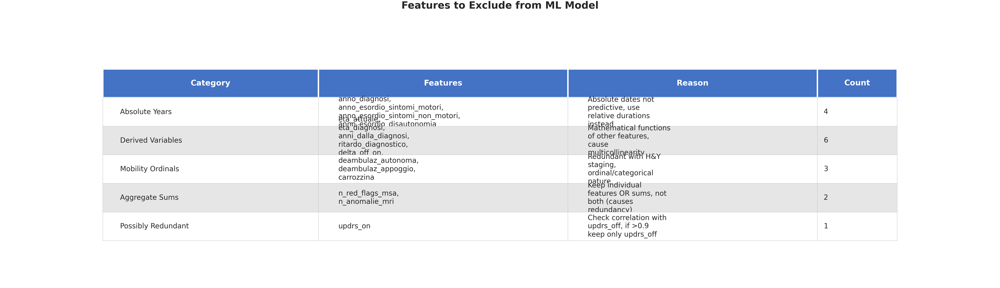

/home/zano/Documents/TESI/FOLDER_CINECA/clinica/utils/tables.py:199: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
/home/zano/Documents/TESI/FOLDER_CINECA/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


✅ Table saved: images/tables/feature_tiers_table.png


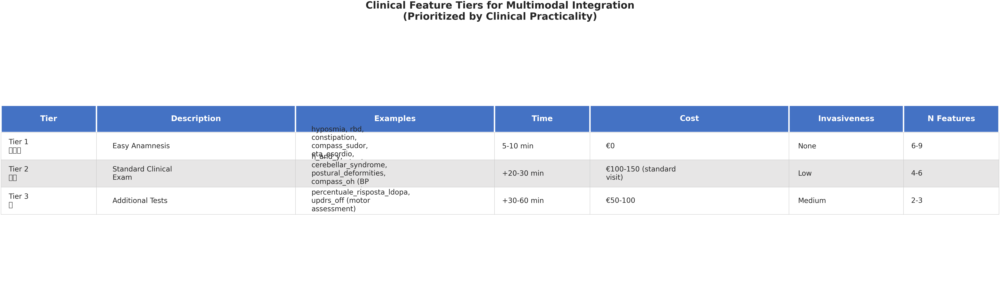

/home/zano/Documents/TESI/FOLDER_CINECA/clinica/utils/tables.py:199: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.


✅ Table saved: images/tables/recommended_features_table.png


/home/zano/Documents/TESI/FOLDER_CINECA/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


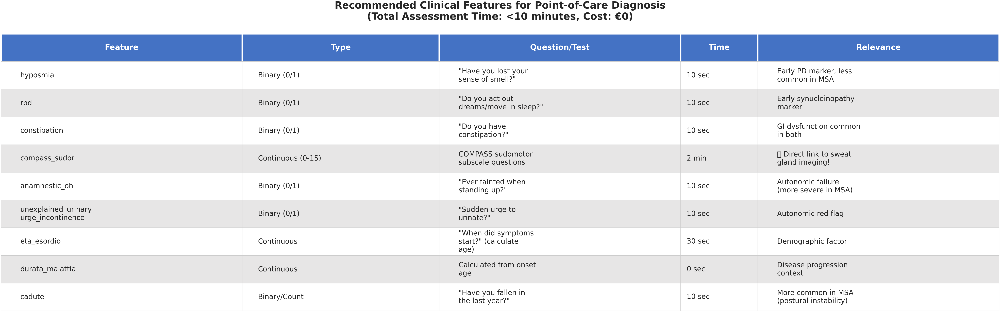

✅ Table saved: images/tables/performance_comparison_table.png


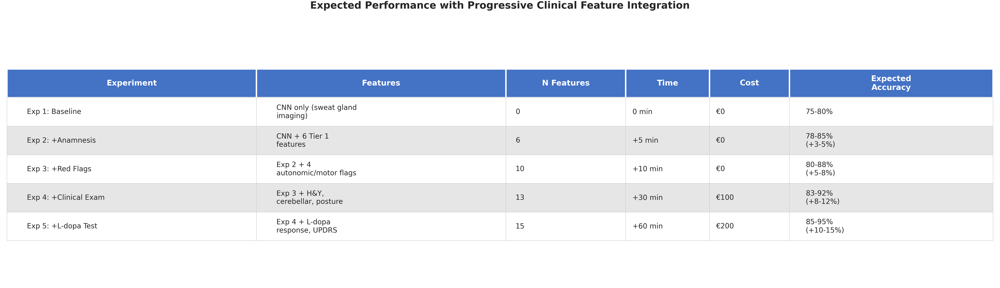


✅ ALL TABLES CREATED SUCCESSFULLY!

Saved tables:
  1. images/features_to_exclude_table.png
  2. images/feature_tiers_table.png
  3. images/recommended_features_table.png
  4. images/performance_comparison_table.png

📊 Displaying tables...



In [ ]:
from clinica.utils.tables import create_table_image
import pandas as pd

print("=" * 70)
print("CREATING FEATURE RECOMMENDATION TABLES")
print("=" * 70)

# =============================================================================
# TABLE 1: Features to EXCLUDE
# =============================================================================
exclude_data = [
    {
        'Category': 'Absolute Years',
        'Features': 'anno_diagnosi, anno_esordio_sintomi_motori,\nanno_esordio_sintomi_non_motori,\nanno_esordio_disautonomia',
        'Reason': 'Absolute dates not predictive,\nuse relative durations instead',
        'Count': '4'
    },
    {
        'Category': 'Derived Variables',
        'Features': 'eta_attuale, eta_diagnosi,\nanni_dalla_diagnosi, ritardo_diagnostico,\ndelta_off_on, ledd_per_anno',
        'Reason': 'Mathematical functions of other features,\ncause multicollinearity',
        'Count': '6'
    },
    {
        'Category': 'Mobility Ordinals',
        'Features': 'deambulaz_autonoma, deambulaz_appoggio,\ncarrozzina',
        'Reason': 'Redundant with H&Y staging,\nordinal/categorical nature',
        'Count': '3'
    },
    {
        'Category': 'Aggregate Sums',
        'Features': 'n_red_flags_msa, n_anomalie_mri',
        'Reason': 'Keep individual features OR sums,\nnot both (causes redundancy)',
        'Count': '2'
    },
    {
        'Category': 'Possibly Redundant',
        'Features': 'updrs_on',
        'Reason': 'Check correlation with updrs_off,\nif >0.9 keep only updrs_off',
        'Count': '1'
    }
]

exclude_df = pd.DataFrame(exclude_data)
create_table_image(
    exclude_df,
    'Features to Exclude from ML Model',
    'features_to_exclude_table.png'
)

# =============================================================================
# TABLE 2: Feature Tiers (for multimodal integration)
# =============================================================================
tier_data = [
    {
        'Tier': 'Tier 1\n⭐⭐⭐',
        'Description': 'Easy Anamnesis',
        'Examples': 'hyposmia, rbd, constipation,\ncompass_sudor, eta_esordio,\ndurata_malattia',
        'Time': '5-10 min',
        'Cost': '€0',
        'Invasiveness': 'None',
        'N Features': '6-9'
    },
    {
        'Tier': 'Tier 2\n⭐⭐',
        'Description': 'Standard Clinical\nExam',
        'Examples': 'h_and_y, cerebellar_syndrome,\npostural_deformities,\ncompass_oh (BP measurement)',
        'Time': '+20-30 min',
        'Cost': '€100-150\n(standard visit)',
        'Invasiveness': 'Low',
        'N Features': '4-6'
    },
    {
        'Tier': 'Tier 3\n⭐',
        'Description': 'Additional Tests',
        'Examples': 'percentuale_risposta_ldopa,\nupdrs_off (motor assessment)',
        'Time': '+30-60 min',
        'Cost': '€50-100',
        'Invasiveness': 'Medium',
        'N Features': '2-3'
    }
]

tier_df = pd.DataFrame(tier_data)
create_table_image(
    tier_df,
    'Clinical Feature Tiers for Multimodal Integration\n(Prioritized by Clinical Practicality)',
    'feature_tiers_table.png'
)

# =============================================================================
# TABLE 3: Recommended Features for Quick Diagnosis
# =============================================================================
recommended_data = [
    {
        'Feature': 'hyposmia',
        'Type': 'Binary (0/1)',
        'Question/Test': '"Have you lost your sense of smell?"',
        'Time': '10 sec',
        'Relevance': 'Early PD marker, less common in MSA'
    },
    {
        'Feature': 'rbd',
        'Type': 'Binary (0/1)',
        'Question/Test': '"Do you act out dreams/move in sleep?"',
        'Time': '10 sec',
        'Relevance': 'Early synucleinopathy marker'
    },
    {
        'Feature': 'constipation',
        'Type': 'Binary (0/1)',
        'Question/Test': '"Do you have constipation?"',
        'Time': '10 sec',
        'Relevance': 'GI dysfunction common in both'
    },
    {
        'Feature': 'compass_sudor',
        'Type': 'Continuous (0-15)',
        'Question/Test': 'COMPASS sudomotor subscale questions',
        'Time': '2 min',
        'Relevance': '⭐ Direct link to sweat gland imaging!'
    },
    {
        'Feature': 'anamnestic_oh',
        'Type': 'Binary (0/1)',
        'Question/Test': '"Ever fainted when standing up?"',
        'Time': '10 sec',
        'Relevance': 'Autonomic failure (more severe in MSA)'
    },
    {
        'Feature': 'unexplained_urinary_\nurge_incontinence',
        'Type': 'Binary (0/1)',
        'Question/Test': '"Sudden urge to urinate?"',
        'Time': '10 sec',
        'Relevance': 'Autonomic red flag'
    },
    {
        'Feature': 'eta_esordio',
        'Type': 'Continuous',
        'Question/Test': '"When did symptoms start?" (calculate age)',
        'Time': '30 sec',
        'Relevance': 'Demographic factor'
    },
    {
        'Feature': 'durata_malattia',
        'Type': 'Continuous',
        'Question/Test': 'Calculated from onset age',
        'Time': '0 sec',
        'Relevance': 'Disease progression context'
    },
    {
        'Feature': 'cadute',
        'Type': 'Binary/Count',
        'Question/Test': '"Have you fallen in the last year?"',
        'Time': '10 sec',
        'Relevance': 'More common in MSA (postural instability)'
    }
]

recommended_df = pd.DataFrame(recommended_data)
create_table_image(
    recommended_df,
    'Recommended Clinical Features for Point-of-Care Diagnosis\n(Total Assessment Time: <10 minutes, Cost: €0)',
    'recommended_features_table.png'
)

# =============================================================================
# TABLE 4: Expected Performance Improvements
# =============================================================================
performance_data = [
    {
        'Experiment': 'Exp 1: Baseline',
        'Features': 'CNN only (sweat gland imaging)',
        'N Features': '0',
        'Time': '0 min',
        'Cost': '€0',
        'Expected\nAccuracy': '75-80%'
    },
    {
        'Experiment': 'Exp 2: +Anamnesis',
        'Features': 'CNN + 6 Tier 1 features',
        'N Features': '6',
        'Time': '+5 min',
        'Cost': '€0',
        'Expected\nAccuracy': '78-85%\n(+3-5%)'
    },
    {
        'Experiment': 'Exp 3: +Red Flags',
        'Features': 'Exp 2 + 4 autonomic/motor flags',
        'N Features': '10',
        'Time': '+10 min',
        'Cost': '€0',
        'Expected\nAccuracy': '80-88%\n(+5-8%)'
    },
    {
        'Experiment': 'Exp 4: +Clinical Exam',
        'Features': 'Exp 3 + H&Y, cerebellar, posture',
        'N Features': '13',
        'Time': '+30 min',
        'Cost': '€100',
        'Expected\nAccuracy': '83-92%\n(+8-12%)'
    },
    {
        'Experiment': 'Exp 5: +L-dopa Test',
        'Features': 'Exp 4 + L-dopa response, UPDRS',
        'N Features': '15',
        'Time': '+60 min',
        'Cost': '€200',
        'Expected\nAccuracy': '85-95%\n(+10-15%)'
    }
]

performance_df = pd.DataFrame(performance_data)
create_table_image(
    performance_df,
    'Expected Performance with Progressive Clinical Feature Integration',
    'performance_comparison_table.png'
)

print("\n" + "=" * 70)
print("✅ ALL TABLES CREATED SUCCESSFULLY!")
print("=" * 70)
print("\nSaved tables:")
print("  1. images/features_to_exclude_table.png")
print("  2. images/feature_tiers_table.png")
print("  3. images/recommended_features_table.png")
print("  4. images/performance_comparison_table.png")

# Display them
from IPython.display import Image, display

print("\n📊 Displaying tables...\n")
# display(Image('images/features_to_exclude_table.png'))
# display(Image('images/feature_tiers_table.png'))
# display(Image('images/recommended_features_table.png'))
# display(Image('images/performance_comparison_table.png'))

FEATURE IMPORTANCE ANALYSIS FOR ML MODEL
['eta_esordio', 'durata_malattia', 'anni_l_dopa', 'anni_dopaminoaagonisti', 'ledd', 'updrs_on', 'updrs_off', 'h_and_y', 'deambulaz_autonoma', 'deambulaz_appoggio', 'carrozzina', 'cadute', 'compass_totale', 'compass_oh', 'compass_vasc', 'compass_sudor', 'compass_gi', 'compass_uin', 'compass_pupil', 'parkinsonism', 'poor_l_dopa_responsivenes', 'cerebellar_syndrome', 'rapid_progression_w_3_yrs', 'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset', 'craniocervical_dyst_induced_dy_l_dopa', 'severe_speech_impairement_w_3_yrs', 'severe_dysphagia_w_3_yrs', 'unexplained_babinski', 'jerky_myoclonic_postural_or_kinetic_tremor', 'postural_deformities', 'unexplained_voiding_difficulties', 'unexplained_urinary_urge_incontinence', 'anamnestic_oh', 'stridor', 'inspiratory_sighs', 'russamento_osas', 'sonnolenza_diurna', 'cold_discolored_hands_and_feet', 'erectile_disfunction', 'pathologic_laughter_or_crying', 'constipation', 'rbd', 'drooling', 'hypo

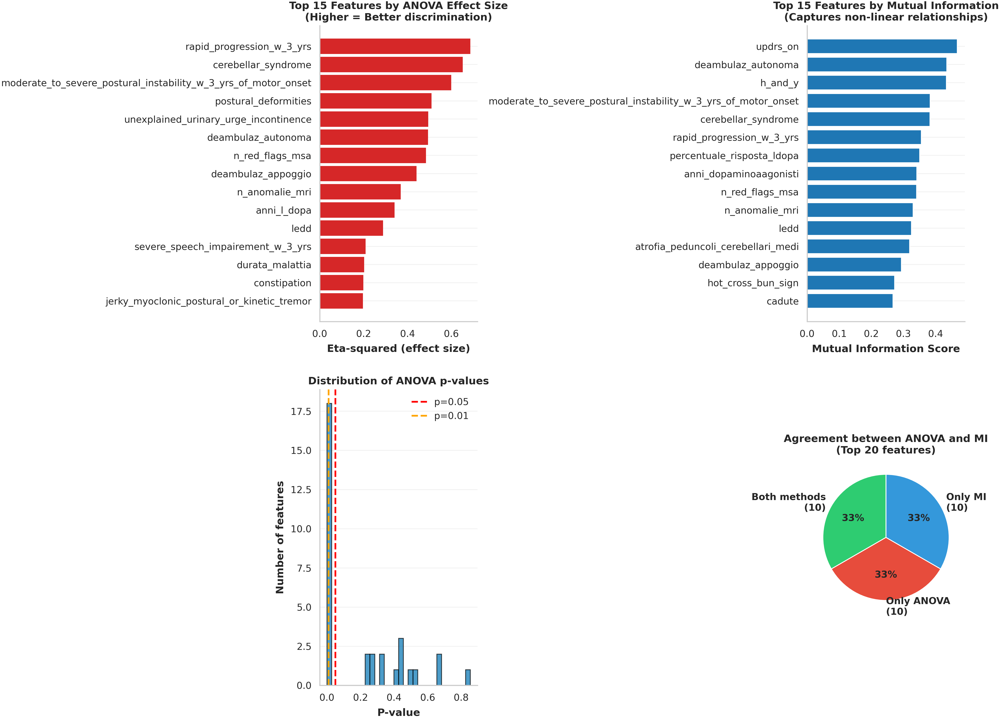

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.feature_selection import mutual_info_classif, f_classif, chi2
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

print("=" * 70)
print("FEATURE IMPORTANCE ANALYSIS FOR ML MODEL")
print("=" * 70)

# Encode diagnosis as numerical for some analyses
le = LabelEncoder()
y_encoded = le.fit_transform(df['diagnosi_definita'])
# print(y_encoded) ## [0,0,0,1,1,.......,2,2,2]   
# MSA-P=0, MSA-C=1, PD=2 (or similar)
keep_cols = [
    # Demographics
    'eta_esordio',                # Età onset (non derivata da anni)
    'durata_malattia',            # Durata totale
    
    # Motor Assessment
    'updrs_off',                  # Motor severity OFF medication
    'h_and_y',                    # Disease staging
    
    # Treatment
    'anni_l_dopa',                # Anni di trattamento L-dopa
    'anni_dopaminoaagonisti',     # Anni dopamino-agonisti
    'ledd',                       # Dose equivalente L-dopa
    'percentuale_risposta_ldopa', # 🌟 KEY DISCRIMINATOR!
    
    # Autonomic (COMPASS)
    'compass_totale',             # Overall autonomic
    'compass_oh',                 # Orthostatic hypotension
    'compass_vasc',               # Vasomotor
    'compass_sudor',              # 🌟 Sweat (your thesis!)
    'compass_gi',                 # Gastrointestinal
    'compass_uin',                # Urinary
    'compass_pupil',              # Pupillomotor
    
    # Progression
    'progression_rate',           # Speed of decline
    'cadute',                     # Falls
    
    # Red Flags (individuali)
    'parkinsonism',
    'poor_l_dopa_responsivenes',
    'cerebellar_syndrome',
    'rapid_progression_w_3_yrs',
    'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset',
    'craniocervical_dyst_induced_dy_l_dopa',
    'severe_speech_impairement_w_3_yrs',
    'severe_dysphagia_w_3_yrs',
    'unexplained_babinski',
    'jerky_myoclonic_postural_or_kinetic_tremor',
    'postural_deformities',
    
    # Autonomic Red Flags
    'unexplained_voiding_difficulties',
    'unexplained_urinary_urge_incontinence',
    'anamnestic_oh',
    'stridor',
    'inspiratory_sighs',
    
    # Other Symptoms
    'russamento_osas',
    'sonnolenza_diurna',
    'cold_discolored_hands_and_feet',
    'erectile_disfunction',
    'pathologic_laughter_or_crying',
    'constipation',
    'rbd',                        # REM sleep behavior disorder
    'drooling',
    'hyposmia',                   # Loss of smell
    'pain',
    'fatigue',
    'visual_alteration',
    'behavioural_alteration',
    'cognitive_decline',
    
    # MRI Features (individuali)
    'atrofia_del_putamen',
    'atrofia_peduncoli_cerebellari_medi',
    'atrofia_ponte',
    'atrofia_cervelletto',
    'hot_cross_bun_sign',         # 🌟 Very specific for MSA-C
    'iperintensita_putamen',
    'iperintensita_peduncoli_cerebellari_medi',
    'caduta_segnale_putamen',
]
# Select potential features (exclude target and non-informative columns)
exclude_cols = ['diagnosi_definita', 'diagnosi_di_invio', 'data_di_nascita', 
                'anno_nascita', 'annotazioni_su_diagnosi_finale', 'tipo_deformita','anno_diagnosi',
                'anno_esordio_sintomi_motori', 'anno_esordio_sintomi_non_motori', 'anno_esordio_disautonomia',
                'eta_attuale',           # Derivata: anno_corrente - anno_nascita
                'eta_diagnosi',          # Derivata: anno_diagnosi - anno_nascita  
                'anni_dalla_diagnosi',   # Derivata: anno_corrente - anno_diagnosi
                'ritardo_diagnostico',   # Derivata: anno_diagnosi - anno_esordio
                'delta_off_on',          # Derivata: updrs_off - updrs_on
                'ledd_per_anno',  
                ]

# Get numerical features
numerical_features = df.select_dtypes(include=[np.number]).columns.tolist()
numerical_features = [col for col in numerical_features if col not in exclude_cols]
print(numerical_features)

print(f"\n📊 Analyzing {len(numerical_features)} numerical features\n")

# =============================================================================
# METHOD 1: ANOVA F-statistic (most interpretable for continuous features)
# =============================================================================
print("\n" + "=" * 70)
print("METHOD 1: ANOVA F-statistic")
print("Tests if feature means differ significantly across diagnoses")
print("=" * 70)

diagnoses = CLASSES_ORDER # ['MSA-P', 'MSA-C', 'PD']

anova_results = []

for feature in numerical_features:
    # Get data for each diagnosis group, it gets the feature values for each diagnosis class
    groups = [df[df['diagnosi_definita'] == diag][feature]
              for diag in diagnoses]
    
    # ANOVA test
    f_stat, p_value = stats.f_oneway(*groups)
    
    # Calculate effect size (eta-squared)
    # How much variance in feature is explained by diagnosis
    grand_mean = np.concatenate(groups).mean()
    ss_between = sum(len(g) * (g.mean() - grand_mean)**2 for g in groups) # sum of squares between groups
    ss_total = sum((np.concatenate(groups) - grand_mean)**2) # sum of squares total
    eta_squared = ss_between / ss_total if ss_total > 0 else 0 # if ss_total is 0, eta_squared is 0
    
    anova_results.append({
        'Feature': feature,
        'F-statistic': f_stat,
        'p-value': p_value,
        'Eta-squared': eta_squared,
        'Significant': '***' if p_value < 0.001 else '**' if p_value < 0.01 else '*' if p_value < 0.05 else ''
    })

anova_df = pd.DataFrame(anova_results).sort_values('Eta-squared', ascending=False)

print("\n🔝 Top 22 most discriminative features (by effect size):\n")
print(anova_df.head(22).to_string(index=False))

# =============================================================================
# METHOD 2: Mutual Information (non-linear relationships)
# =============================================================================
print("\n\n" + "=" * 70)
print("METHOD 2: Mutual Information")
print("Captures non-linear relationships (more general than correlation)")
print("=" * 70)

# Prepare data (remove NaN)
X = df[numerical_features].fillna(df[numerical_features].median())
mi_scores = mutual_info_classif(X, y_encoded, random_state=42)

mi_df = pd.DataFrame({
    'Feature': numerical_features,
    'MI_Score': mi_scores
}).sort_values('MI_Score', ascending=False)

print("\n🔝 Top 22 features by Mutual Information:\n")
print(mi_df.head(22).to_string(index=False))

# =============================================================================
# VISUALIZATION: Feature Importance
# =============================================================================
print("\n\n📊 Creating visualizations...\n")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Top features by ANOVA F-statistic
ax = axes[0, 0]
top_anova = anova_df.head(15)
bars = ax.barh(range(len(top_anova)), top_anova['Eta-squared'])
ax.set_yticks(range(len(top_anova)))
ax.set_yticklabels(top_anova['Feature'])
ax.set_xlabel('Eta-squared (effect size)', fontweight='bold')
ax.set_title('Top 15 Features by ANOVA Effect Size\n(Higher = Better discrimination)', 
             fontweight='bold', fontsize=12)
ax.invert_yaxis()

# Color bars by significance
colors = ['#d62728' if p < 0.001 else '#ff7f0e' if p < 0.01 else '#2ca02c' if p < 0.05 else '#7f7f7f' 
          for p in top_anova['p-value']]
for bar, color in zip(bars, colors):
    bar.set_color(color)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot 2: Top features by Mutual Information
ax = axes[0, 1]
top_mi = mi_df.head(15)
ax.barh(range(len(top_mi)), top_mi['MI_Score'], color='#1f77b4')
ax.set_yticks(range(len(top_mi)))
ax.set_yticklabels(top_mi['Feature'])
ax.set_xlabel('Mutual Information Score', fontweight='bold')
ax.set_title('Top 15 Features by Mutual Information\n(Captures non-linear relationships)', 
             fontweight='bold', fontsize=12)
ax.invert_yaxis()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot 3: P-value distribution
ax = axes[1, 0]
ax.hist(anova_df['p-value'], bins=30, edgecolor='black', alpha=0.7)
ax.axvline(0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax.axvline(0.01, color='orange', linestyle='--', linewidth=2, label='p=0.01')
ax.set_xlabel('P-value', fontweight='bold')
ax.set_ylabel('Number of features', fontweight='bold')
ax.set_title('Distribution of ANOVA p-values', fontweight='bold', fontsize=12)
ax.legend()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot 4: Comparison of rankings
ax = axes[1, 1]
# Merge rankings
top_20_anova = set(anova_df.head(20)['Feature'])
top_20_mi = set(mi_df.head(20)['Feature'])
both = top_20_anova & top_20_mi
only_anova = top_20_anova - top_20_mi
only_mi = top_20_mi - top_20_anova

sizes = [len(both), len(only_anova), len(only_mi)]
labels = [f'Both methods\n({len(both)})', 
          f'Only ANOVA\n({len(only_anova)})', 
          f'Only MI\n({len(only_mi)})']
colors_pie = ['#2ecc71', '#e74c3c', '#3498db']

ax.pie(sizes, labels=labels, colors=colors_pie, autopct='%1.0f%%',
       startangle=90, textprops={'fontweight': 'bold', 'fontsize': 11})
ax.set_title('Agreement between ANOVA and MI\n(Top 20 features)', 
             fontweight='bold', fontsize=12)

plt.tight_layout()
sm.savefig(f'{IMAGES_SAVE_PATH}/feature_importance_analysis.png')
print(f"✅ Saved: {IMAGES_SAVE_PATH}/feature_importance_analysis.png")

# from IPython.display import Image, display
# # display(Image(f'{IMAGES_SAVE_PATH}/feature_importance_analysis.png'))

# =============================================================================
# FEATURE RECOMMENDATIONS FOR ML
# =============================================================================
print("\n\n" + "=" * 70)
print("🎯 RECOMMENDED FEATURES FOR ML MODEL")
print("=" * 70)

# Features that rank high in BOTH methods
top_features = []
for feature in anova_df.head(30)['Feature']:
    if feature in mi_df.head(30)['Feature'].values:
        anova_rank = anova_df[anova_df['Feature'] == feature].index[0] + 1
        mi_rank = mi_df[mi_df['Feature'] == feature].index[0] + 1
        avg_rank = (anova_rank + mi_rank) / 2
        
        eta2 = anova_df[anova_df['Feature'] == feature]['Eta-squared'].values[0]
        mi_score = mi_df[mi_df['Feature'] == feature]['MI_Score'].values[0]
        
        top_features.append({
            'Feature': feature,
            'ANOVA_Rank': anova_rank,
            'MI_Rank': mi_rank,
            'Avg_Rank': avg_rank,
            'Eta-squared': eta2,
            'MI_Score': mi_score
        })

top_features_df = pd.DataFrame(top_features).sort_values('Avg_Rank')

print("\n✨ Top features by consensus ranking:\n")
print(top_features_df.head(15).to_string(index=False))

print("\n\n💡 INTERPRETATION:")
print("-" * 70)
print("• Eta-squared: 0.01=small, 0.06=medium, 0.14=large effect")
print("• p < 0.05: Statistically significant")
print("• MI Score: Higher = more information about diagnosis")
print("• Use top 10-20 features that appear in both rankings")
print("• Avoid highly correlated features (check correlation matrix)")

CREATING FEATURE IMPORTANCE TABLES AS IMAGES
✅ Table saved: images/tables/feature_importance_anova.png


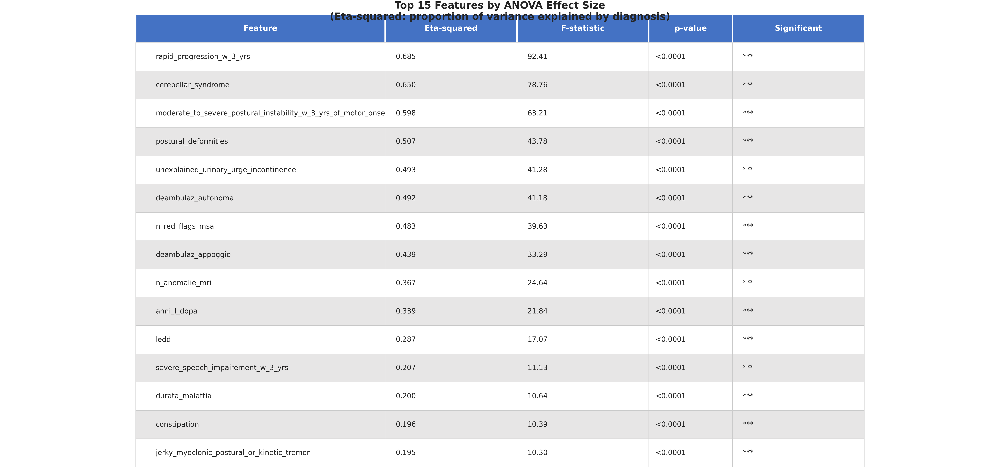

✅ Table saved: images/tables/feature_importance_mi.png


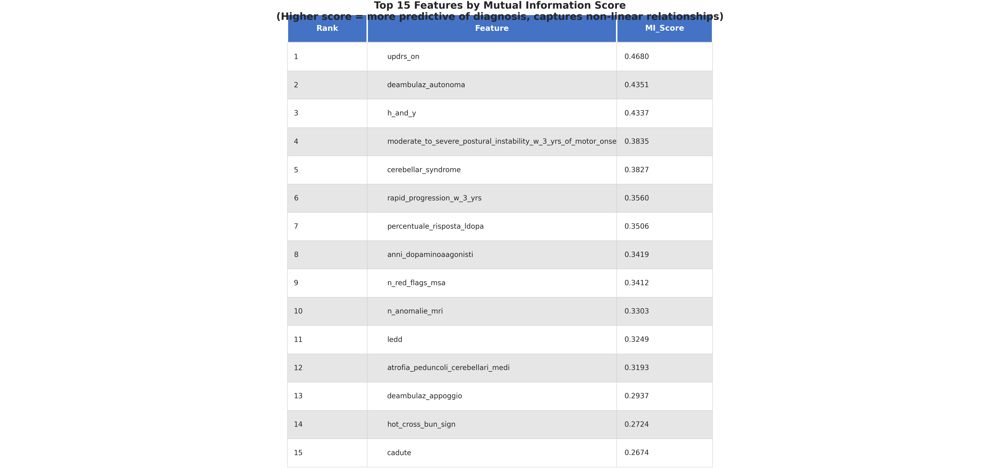

✅ Table saved: images/tables/feature_importance_consensus.png


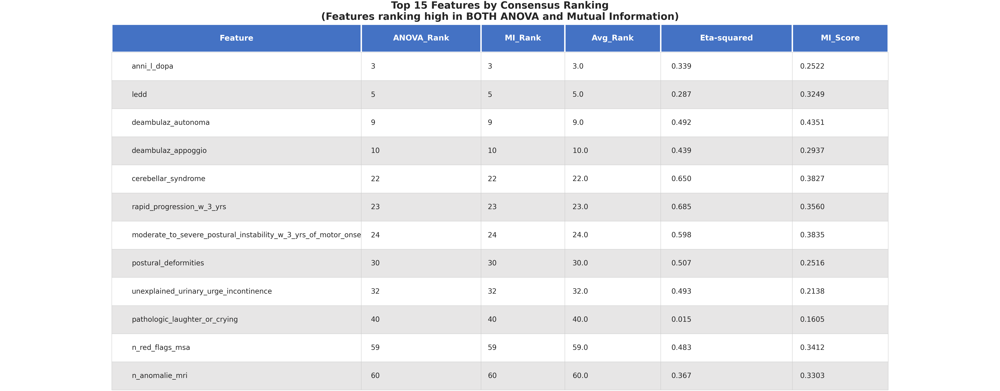

✅ Table saved: images/tables/metrics_interpretation_guide.png


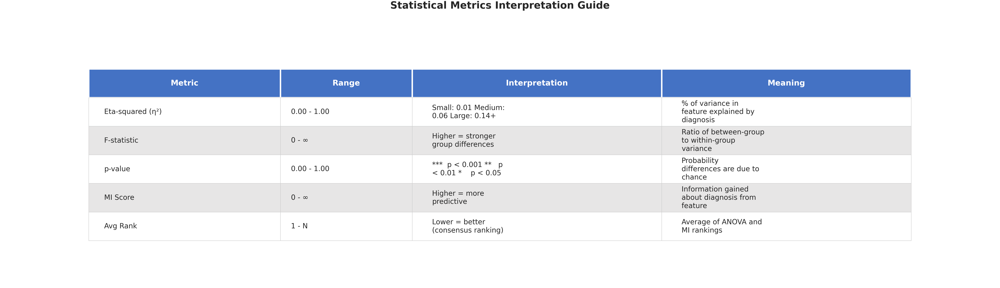


✅ ALL FEATURE IMPORTANCE TABLES CREATED!

Saved in images/tables/ directory:
  1. feature_importance_anova.png
  2. feature_importance_mi.png
  3. feature_importance_consensus.png
  4. metrics_interpretation_guide.png

📊 Displaying tables...



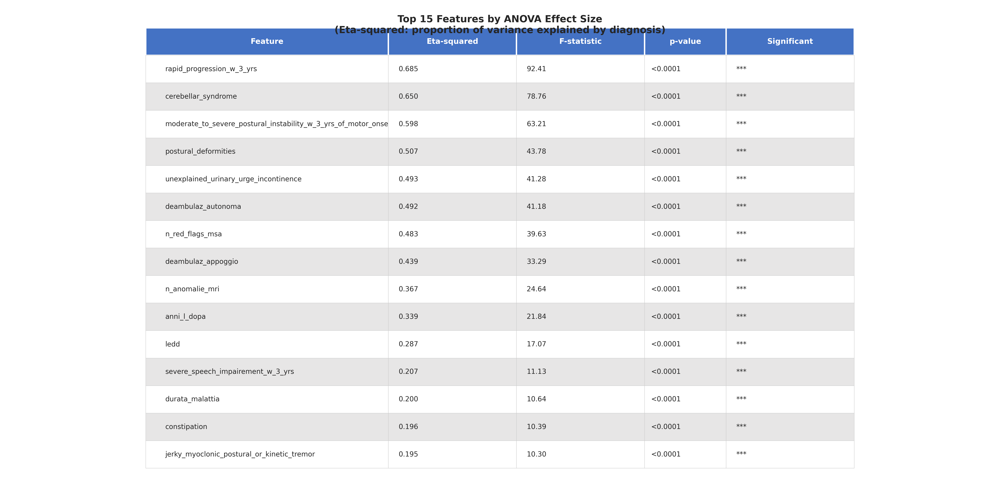

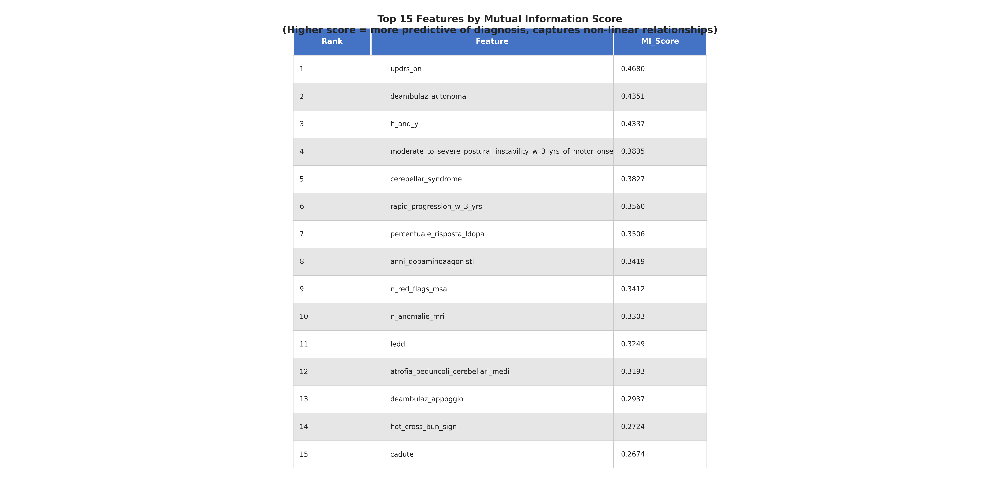

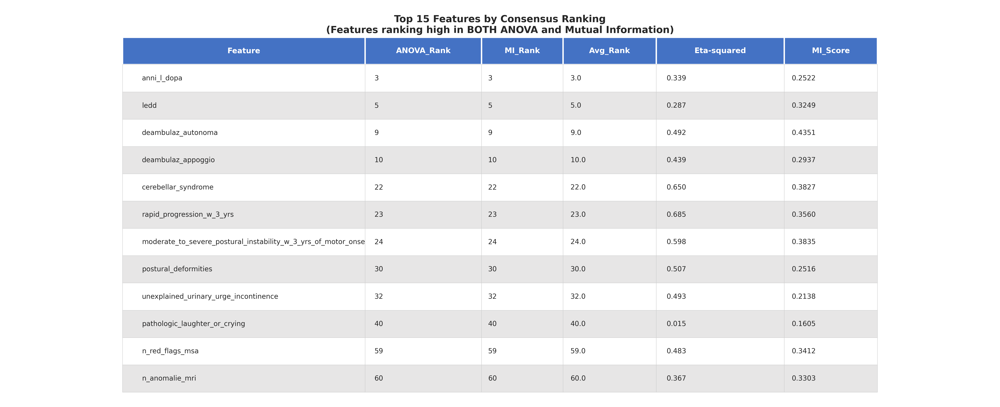

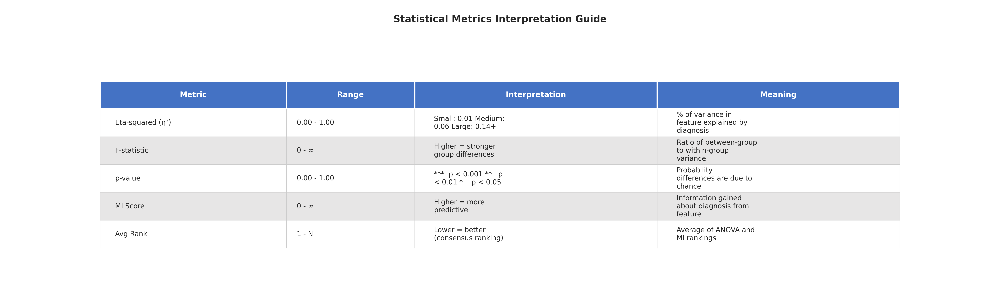

In [ ]:
from clinica.utils.tables import create_table_image

print("=" * 70)
print("CREATING FEATURE IMPORTANCE TABLES AS IMAGES")
print("=" * 70)

# =============================================================================
# TABLE 1: Top Features by ANOVA
# =============================================================================
# Select top 15 and format for display
anova_table = anova_df.head(15).copy()
anova_table['Eta-squared'] = anova_table['Eta-squared'].apply(lambda x: f'{x:.3f}')
anova_table['F-statistic'] = anova_table['F-statistic'].apply(lambda x: f'{x:.2f}')
anova_table['p-value'] = anova_table['p-value'].apply(lambda x: f'{x:.4f}' if x >= 0.0001 else '<0.0001')

# Select columns for display
anova_display = anova_table[['Feature', 'Eta-squared', 'F-statistic', 'p-value', 'Significant']]

create_table_image(
    anova_display,
    'Top 15 Features by ANOVA Effect Size\n(Eta-squared: proportion of variance explained by diagnosis)',
    'feature_importance_anova.png'
)

# =============================================================================
# TABLE 2: Top Features by Mutual Information
# =============================================================================
mi_table = mi_df.head(15).copy()
mi_table['MI_Score'] = mi_table['MI_Score'].apply(lambda x: f'{x:.4f}')

# Add rank column
mi_table.insert(0, 'Rank', range(1, len(mi_table) + 1))

create_table_image(
    mi_table,
    'Top 15 Features by Mutual Information Score\n(Higher score = more predictive of diagnosis, captures non-linear relationships)',
    'feature_importance_mi.png'
)

# =============================================================================
# TABLE 3: Consensus Top Features (both methods)
# =============================================================================
consensus_table = top_features_df.head(15).copy()
consensus_table['Eta-squared'] = consensus_table['Eta-squared'].apply(lambda x: f'{x:.3f}')
consensus_table['MI_Score'] = consensus_table['MI_Score'].apply(lambda x: f'{x:.4f}')
consensus_table['Avg_Rank'] = consensus_table['Avg_Rank'].apply(lambda x: f'{x:.1f}')
consensus_table['ANOVA_Rank'] = consensus_table['ANOVA_Rank'].astype(int)
consensus_table['MI_Rank'] = consensus_table['MI_Rank'].astype(int)

create_table_image(
    consensus_table,
    'Top 15 Features by Consensus Ranking\n(Features ranking high in BOTH ANOVA and Mutual Information)',
    'feature_importance_consensus.png'
)

# =============================================================================
# TABLE 4: Feature Interpretation Guide
# =============================================================================
interpretation_data = [
    {
        'Metric': 'Eta-squared (η²)',
        'Range': '0.00 - 1.00',
        'Interpretation': 'Small: 0.01\nMedium: 0.06\nLarge: 0.14+',
        'Meaning': '% of variance in feature\nexplained by diagnosis'
    },
    {
        'Metric': 'F-statistic',
        'Range': '0 - ∞',
        'Interpretation': 'Higher = stronger\ngroup differences',
        'Meaning': 'Ratio of between-group\nto within-group variance'
    },
    {
        'Metric': 'p-value',
        'Range': '0.00 - 1.00',
        'Interpretation': '***  p < 0.001\n**   p < 0.01\n*    p < 0.05',
        'Meaning': 'Probability differences\nare due to chance'
    },
    {
        'Metric': 'MI Score',
        'Range': '0 - ∞',
        'Interpretation': 'Higher = more\npredictive',
        'Meaning': 'Information gained about\ndiagnosis from feature'
    },
    {
        'Metric': 'Avg Rank',
        'Range': '1 - N',
        'Interpretation': 'Lower = better\n(consensus ranking)',
        'Meaning': 'Average of ANOVA and MI\nrankings'
    }
]

interpretation_df = pd.DataFrame(interpretation_data)

create_table_image(
    interpretation_df,
    'Statistical Metrics Interpretation Guide',
    'metrics_interpretation_guide.png'
)

print("\n" + "=" * 70)
print("✅ ALL FEATURE IMPORTANCE TABLES CREATED!")
print("=" * 70)
print("\nSaved in images/tables/ directory:")
print("  1. feature_importance_anova.png")
print("  2. feature_importance_mi.png")
print("  3. feature_importance_consensus.png")
print("  4. metrics_interpretation_guide.png")

# Display them
from IPython.display import Image, display

print("\n📊 Displaying tables...\n")
display(Image('images/tables/feature_importance_anova.png'))
display(Image('images/tables/feature_importance_mi.png'))
display(Image('images/tables/feature_importance_consensus.png'))
display(Image('images/tables/metrics_interpretation_guide.png'))

**item diagnostici per MSA-P
Considerate che la risonanza è un dato molto forte ma è anche un dato che viene più tardivamente**

- Poor L-Dopa responsivenes
- Rapid progression w 3 yrs
- Moderate to severe postural instability w 3 yrs of motor onset
- Craniocervical dyst induced dy L-Dopa
- Severe speech impairement w 3 yrs
- Severe dysphagia w 3 yrs
- Unexplained Babinski
- Jerky myoclonic postural or kinetic tremor
- Postural deformities
- Unexplained voiding difficulties
- Unexplained urinary urge-incontinence
- Stridor
-Inspiratory sighs
- Cold discolored hands and feet
- Pathologic laughter or crying


**MRI**
- Atrofia del putamen	
-Atrofia peduncoli cerebellari medi	
- Atrofia ponte	
- Atrofia cervelletto	
- Hot cross bun sign	
- Iperintensità putamen	
- Iperintensità peduncoli cerebellari medi	
- caduta segnale putamen

In [231]:
# Red Flags (clinical symptoms)
red_flags = [
    "poor_l_dopa_responsiveness",
    "rapid_progression_w_3_yrs",
    "moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset",
    "craniocervical_dyst_induced_dy_l_dopa",
    "severe_speech_impairment_w_3_yrs",
    "severe_dysphagia_w_3_yrs",
    "unexplained_babinski",
    "jerky_myoclonic_postural_or_kinetic_tremor",
    "postural_deformities",
    "unexplained_voiding_difficulties",
    "unexplained_urinary_urge_incontinence",
    "stridor",
    "inspiratory_sighs",
    "cold_discolored_hands_and_feet",
    "pathologic_laughter_or_crying"
]

# MRI findings
mri_findings = [
    "atrofia_del_putamen",
    "atrofia_peduncoli_cerebellari_medi",
    "atrofia_ponte",
    "atrofia_cervelletto",
    "hot_cross_bun_sign",
    "iperintensita_putamen",
    "iperintensita_peduncoli_cerebellari_medi",
    "caduta_segnale_putamen"
]

df.columns.tolist()

['sesso',
 'data_di_nascita',
 'diagnosi_di_invio',
 'diagnosi_definita',
 'anno_diagnosi',
 'anno_esordio_sintomi_motori',
 'anno_esordio_sintomi_non_motori',
 'anno_esordio_disautonomia',
 'eta_esordio',
 'durata_malattia',
 'anni_l_dopa',
 'anni_dopaminoaagonisti',
 'ledd',
 'updrs_on',
 'updrs_off',
 'delta_off_on',
 'h_and_y',
 'deambulaz_autonoma',
 'deambulaz_appoggio',
 'carrozzina',
 'cadute',
 'parkinsonism',
 'poor_l_dopa_responsivenes',
 'cerebellar_syndrome',
 'rapid_progression_w_3_yrs',
 'moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset',
 'craniocervical_dyst_induced_dy_l_dopa',
 'severe_speech_impairement_w_3_yrs',
 'severe_dysphagia_w_3_yrs',
 'unexplained_babinski',
 'jerky_myoclonic_postural_or_kinetic_tremor',
 'postural_deformities',
 'fog',
 'unexplained_voiding_difficulties',
 'unexplained_urinary_urge_incontinence',
 'anamnestic_oh',
 'stridor',
 'inspiratory_sighs',
 'russamento_osas',
 'sonnolenza_diurna',
 'cold_discolored_hands_and_feet',
 'er